# `l2hmc`: Example

<a href="https://arxiv.org/abs/2105.03418"><img alt="arxiv" src="http://img.shields.io/badge/arXiv-2105.03418-B31B1B.svg" align="left"></a> <a href="https://arxiv.org/abs/2112.01582"><img alt="arxiv" src="http://img.shields.io/badge/arXiv-2112.01582-B31B1B.svg" align="left" style="margin-left:10px;"></a><br>


This notebook will (attempt) to walk through the steps needed to successfully instantiate and "run" an experiment.

For this example, we wish to train the L2HMC sampler for the 2D $U(1)$ lattice gauge model with Wilson action:

$$
S_{\beta}(n) = \beta \sum_{n}\sum_{\mu<\nu}\mathrm{Re}\left[1 - U_{\mu\nu}(n) \right]
$$

This consists of the following steps:
  1. Build an `Experiment` by parsing our configuration object
  2. Train our model using the `Experiment.train()` method
  3. Evaluate our trained model `Experiment.evaluate(job_type='eval')`
  4. Compare our trained models' performance against generic HMC `Experiment.evaluate(job_type='hmc')`
  

<div class="alert alert-block alert-info" style="background:#64B5F630;color:#64B5F6;">
<b><u>Evaluating Performance</u></b>
    
Explicitly, we measure the performance of our model by comparing the _tunneling rate_ $\delta Q$ of our **trained** sampler to that of generic HMC.
    
Explicitly, the tunneling rate is given by:
    
$$
\delta Q = \frac{1}{N_{\mathrm{chains}}}\sum_{\mathrm{chains}} \left|Q_{i+1} - Q_{i}\right|
$$
    
where the difference is between subsequent states in a chain, and the sum is over all $N$ chains (each being ran in parallel, _independently_).
    
Since our goal is to generate _independent configurations_, the more our sampler tunnels between different topological sectors (_tunneling rate_), the more efficient our sampler.
    
</div>


## Imports

In [1]:
import os
import warnings

os.environ['TORCH_CPP_LOG_LEVEL'] = 'ERROR'
os.environ['AUTOGRAPH_VERBOSITY'] = '10'
warnings.filterwarnings('ignore')

print(
    'CUDA_VISIBLE_DEVICES: '
    f"{os.environ['CUDA_VISIBLE_DEVICES']}"
)
!getconf _NPROCESSORS_ONLN

CUDA_VISIBLE_DEVICES: 7
256


In [2]:
os.environ['OMP_NUM_THREADS'] = '256'
#os.environ['TF_ENABLE_AUTO_MIXED_PRECISION'] = '1'
#os.environ['TF_XLA_FLAGS'] = '--tf_xla_auto_jit=2 --tf_xla_enable_xla_devices'

In [3]:
import tensorflow as tf
tf.config.run_functions_eagerly(True)

In [4]:
from __future__ import absolute_import, print_function, annotations, division

# automatically detect and reload local changes to modules
%load_ext autoreload
%autoreload 2

# unset verbose TF XLA Flags
!unset TF_XLA_FLAGS
!unset KMP_AFFINITY KMP_SETTINGS

import os

import hydra
import torch
import tensorflow as tf
import numpy as np
    
from l2hmc.main import setup, setup_tensorflow, setup_torch

_ = setup_torch(
    precision='float32',
    seed=1234,
)

_ = setup_tensorflow(
    precision='float32',
)

from hydra.core.global_hydra import GlobalHydra
from l2hmc.utils.rich import print_config
np.set_printoptions(precision=4, suppress=True)

--------------------------------------------------------------------------

  Local host:   thetagpu23
  Local device: mlx5_0
--------------------------------------------------------------------------
Using: float32 precision


In [5]:
import logging
from rich.style import Style
from rich.console import Console
from rich.logging import RichHandler
from l2hmc.utils.rich import get_console

log = logging.getLogger()
log.setLevel('INFO')

tlog = logging.getLogger('torch')
tlog.setLevel('ERROR')

wblog = logging.getLogger('wandb')
wblog.setLevel('CRITICAL')

# `ExperimentConfig`

Set some reasonable defaults for our experiments

In [8]:
#GlobalHydra.instance().clear()

defaults = [
    'steps.nera=2',
    'steps.nepoch=500',
    'steps.print=250',
    'steps.test=2000',
]

defaults_u1 = [
    *defaults,
    'network.use_batch_norm=false',
    'annealing_schedule.beta_init=4.0',
    'annealing_schedule.beta_final=5.0',
]

In [7]:
outputs = {
    'pytorch': {
        'train': {},
        'eval': {},
        'hmc': {},
    },
    'tensorflow': {
        'train': {},
        'eval': {},
        'hmc': {},
    },
}

# Initialize and Build `Experiment` objects:

- The `l2hmc.configs` module provides a function `get_experiment`:

```python
def get_experiment(overrides: list[str]) -> Experiment:
    ...
```

which will:

1. Load the default options from `conf/config.yaml`
2. Override the default options with any values provided in `overrides`
3. Parse these options and build an `ExperimentConfig` which uniquely defines an experiment
3. Instantiate / return an `Experiment` from the `ExperimentConfig`

```python
>>> train_output = experiment.train()
>>> eval_output = experiment.evaluate(job_type='eval')
>>> hmc_output = experiment.evaluate(job_type='hmc')
```

<div class="alert alert-block alert-info" style="background:#64B5F630;color:#64B5F6;">
<b><u>Overriding Defaults</u></b>

Specifics about the training / evaluation / hmc runs can be flexibly overridden by passing arguments to the training / evaluation / hmc runs, respectively
</div>

In [9]:
# Clear CUDA cache
import gc
gc.collect()
with torch.no_grad():
    torch.cuda.empty_cache()

In [10]:
from l2hmc.configs import get_experiment

ptExpU1 = get_experiment(
    overrides=[
        *defaults_u1,
        'framework=pytorch',
        'init_wandb=false',
        'init_aim=false',
    ]
)

14:56:03 INFO     Using horovod for distributed training                                                   ]8;id=462141;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py\common.py]8;;\:]8;id=7855;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py#112\112]8;;\

14:56:06 DEBUG    Built networks.                                                                        ]8;id=955227;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/dynamics/pytorch/dynamics.py\dynamics.py]8;;\:]8;id=984894;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/dynamics/pytorch/dynamics.py#136\136]8;;\

         DEBUG    dynamics._networks_built: True                                                         ]8;id=846203;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/dynamics/pytorch/dynamics.py\dynamics.py]8;;\:]8;id=36622;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/dynamics/pytorch/dynamics.py#146\146]8;;\

         INFO     Looking for checkpoints in:                                                             ]8;id=726754;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=103202;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#324\324]8;;\
                   /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/che               
                  ckpoints/U1/2-16-16/nlf-8/xsplit-True/sepnets-True/merge-True/4-8-16-32_4-4-4-4_2-2-2-2               
                  /16-16-16-16_dp-0.0_bn-False/pytorch                                                                  

         INFO     Loading model from: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hm ]8;id=803713;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=248313;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#345\345]8;;\
                  c-qcd/src/l2hmc/checkpoints/U1/2-16-16/nlf-8/xsplit-True/sepnets-True/merge-True/4-8-16               
                  -32_4-4-4-4_2-2-2-2/16-16-16-16_dp-0.0_bn-False/pytorch/model.pth                                     

14:56:09 INFO     Loading checkpoint from: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects ]8;id=18274;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=827088;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#349\349]8;;\
                  /l2hmc-qcd/src/l2hmc/checkpoints/U1/2-16-16/nlf-8/xsplit-True/sepnets-True/merge-True/4               
                  -8-16-32_4-4-4-4_2-2-2-2/16-16-16-16_dp-0.0_bn-False/pytorch/ckpt-2-0-2022-11-07-132622               
                  .tar                                                                                                  

14:56:14 WARNING  Using `torch.optim.Adam` optimizer                                                      ]8;id=16609;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=679808;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#139\139]8;;\

14:56:15 INFO     Using horovod for distributed training                                                   ]8;id=653557;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py\common.py]8;;\:]8;id=507768;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py#112\112]8;;\

In [11]:
tfExpU1 = get_experiment(
    overrides=[
        *defaults_u1,
        'framework=tensorflow',
        'backend=horovod',
        'init_wandb=false',
        'init_aim=false',
    ]
)

14:58:42 DEBUG    Setting JobRuntime:name=app                                                               ]8;id=486065;file:///home/foremans/.local/conda/2022-07-01/lib/python3.8/site-packages/hydra/core/utils.py\utils.py]8;;\:]8;id=95721;file:///home/foremans/.local/conda/2022-07-01/lib/python3.8/site-packages/hydra/core/utils.py#279\279]8;;\

# Train

## PyTorch

─────────────────────────────────────────────── ERA: 0 / 2, BETA: 5.000 ────────────────────────────────────────────────

Output()

17:36:18 INFO     era=0   epoch=250 tstep=1250 dt=0.6839 beta=5.0000 loss=2.2576 dQsin=0.1280             ]8;id=742630;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=589008;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#958\958]8;;\
                  dQint=0.0889 energy=405.7238 logprob=405.5275 logdet=0.1963 sldf=2.7945 sldb=-2.7952                  
                  sld=0.1963 xeps=0.2343 veps=0.1710 acc=0.4219 sumlogdet=0.0040 acc_mask=0.4204                        
                  plaqs=0.8934 intQ=-0.0420 sinQ=-0.0346 lr=0.0010                                                      

17:41:26 INFO     Saving checkpoint to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2 ]8;id=593673;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=561073;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#284\284]8;;\
                  hmc-qcd/src/l2hmc/checkpoints/U1/2-16-16/nlf-8/xsplit-True/sepnets-True/merge-True/4-8-               
                  16-32_4-4-4-4_2-2-2-2/16-16-16-16_dp-0.0_bn-False/pytorch/ckpt-0-0-2022-11-07-174126.ta               
                  r                                                                                                     

17:41:28 INFO     Saving took: 1.91598s                                                                  ]8;id=639808;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=628305;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1119\1119]8;;\

         INFO     Era 0 took: 644.243s                                                                   ]8;id=885253;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=468019;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1120\1120]8;;\

─────────────────────────────────────────────── ERA: 1 / 2, BETA: 6.000 ────────────────────────────────────────────────

Output()

17:46:54 INFO     era=1   epoch=250 tstep=1750 dt=0.7493 beta=6.0000 loss=13.0165 dQsin=0.0738            ]8;id=42872;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=389759;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#958\958]8;;\
                  dQint=0.0239 energy=403.3528 logprob=403.1367 logdet=0.2161 sldf=3.1425 sldb=-3.1357                  
                  sld=0.2161 xeps=0.2185 veps=0.1644 acc=0.5025 sumlogdet=-0.0036 acc_mask=0.5054                       
                  plaqs=0.9123 intQ=0.0220 sinQ=0.0195 lr=0.0010                                                        

17:52:05 INFO     Saving checkpoint to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2 ]8;id=72024;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=974885;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#284\284]8;;\
                  hmc-qcd/src/l2hmc/checkpoints/U1/2-16-16/nlf-8/xsplit-True/sepnets-True/merge-True/4-8-               
                  16-32_4-4-4-4_2-2-2-2/16-16-16-16_dp-0.0_bn-False/pytorch/ckpt-1-0-2022-11-07-175205.ta               
                  r                                                                                                     

17:52:06 INFO     Saving took: 1.26966s                                                                  ]8;id=387034;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=799957;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1119\1119]8;;\

         INFO     Era 1 took: 637.384s                                                                   ]8;id=881360;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=708700;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#1120\1120]8;;\

17:52:45 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=428232;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=929364;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#900\900]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-07-145603/pytorch/train/plots/ridgepl                    
                  ots/svgs/energy_ridgeplot.svg                                                                         

17:53:23 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=46794;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=633384;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#900\900]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-07-145603/pytorch/train/plots/ridgepl                    
                  ots/svgs/logprob_ridgeplot.svg                                                                        

17:54:01 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=641683;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=74346;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#900\900]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-07-145603/pytorch/train/plots/ridgepl                    
                  ots/svgs/logdet_ridgeplot.svg                                                                         

17:54:39 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=329418;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=238994;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#900\900]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-07-145603/pytorch/train/plots/ridgepl                    
                  ots/svgs/sldf_ridgeplot.svg                                                                           

17:55:18 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=653530;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=842027;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#900\900]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-07-145603/pytorch/train/plots/ridgepl                    
                  ots/svgs/sldb_ridgeplot.svg                                                                           

17:55:55 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=207817;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=363002;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#900\900]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-07-145603/pytorch/train/plots/ridgepl                    
                  ots/svgs/sld_ridgeplot.svg                                                                            

17:56:12 INFO     Saving dataset to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc- ]8;id=985428;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py\common.py]8;;\:]8;id=985262;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py#318\318]8;;\
                  qcd/src/l2hmc/notebooks/outputs/2022-11-07-145603/pytorch/train/data/train_data.h5                    

17:56:13 WARNING  Unable to save as `.h5` file, falling back to `netCDF4`                                  ]8;id=546580;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py\common.py]8;;\:]8;id=806479;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py#296\296]8;;\

         INFO     Saving dataset to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc- ]8;id=398235;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py\common.py]8;;\:]8;id=516723;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py#310\310]8;;\
                  qcd/src/l2hmc/notebooks/outputs/2022-11-07-145603/pytorch/train/data/train_dataset.nc                 

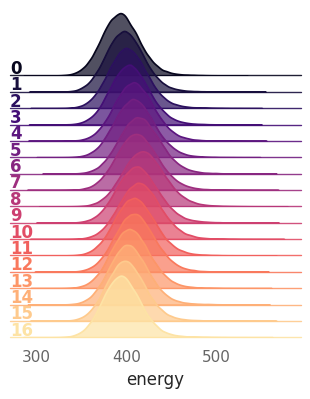

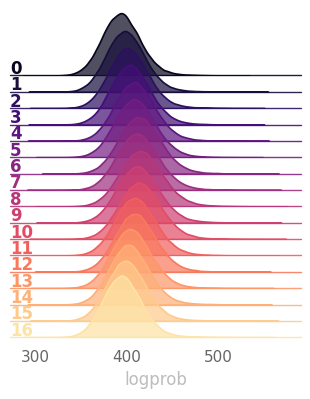

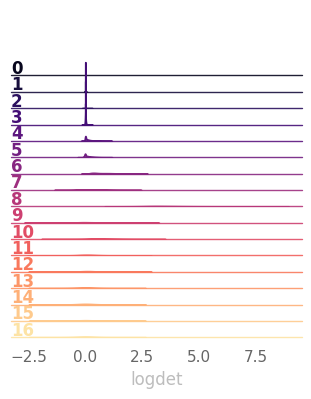

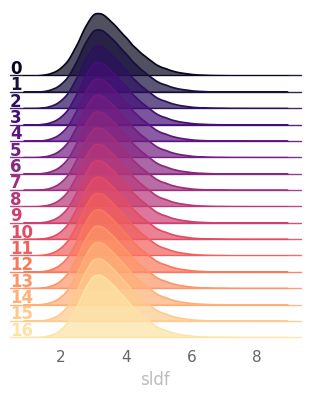

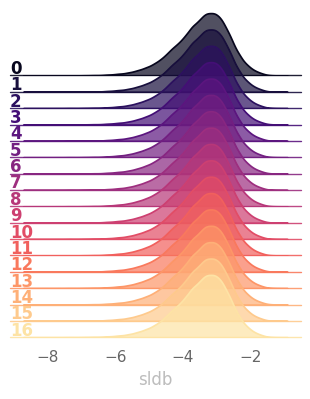

...

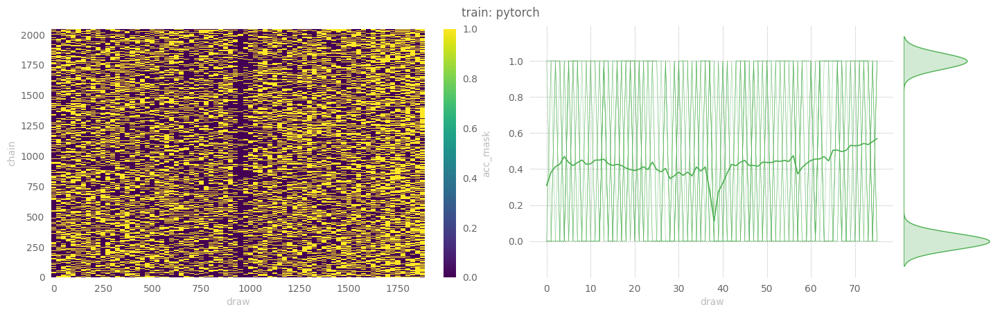

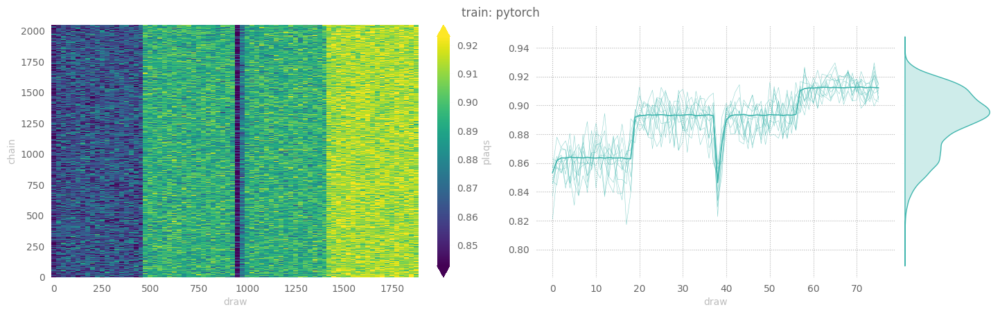

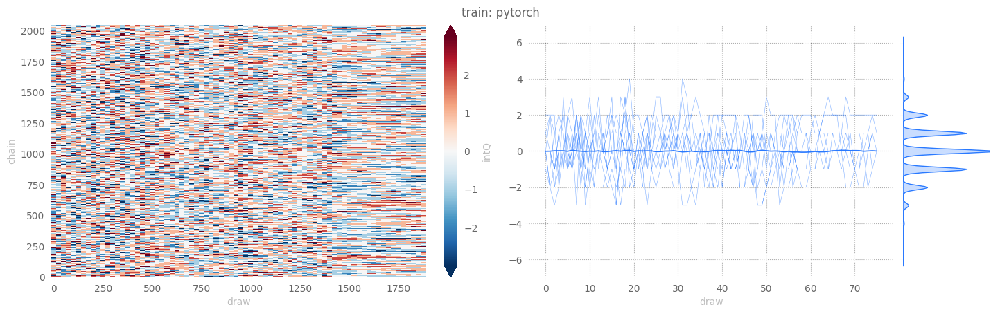

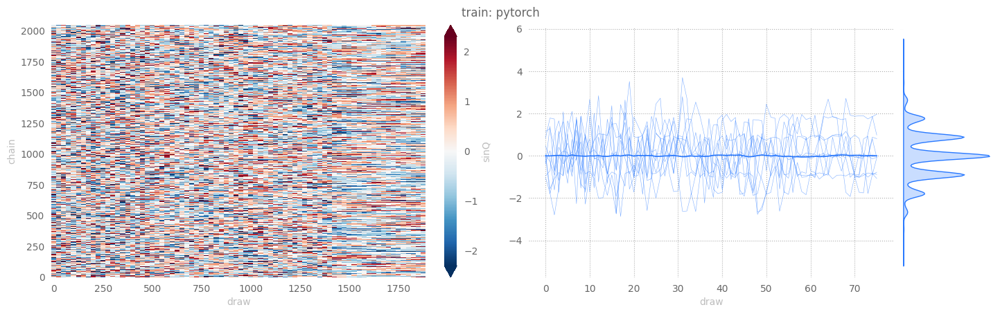

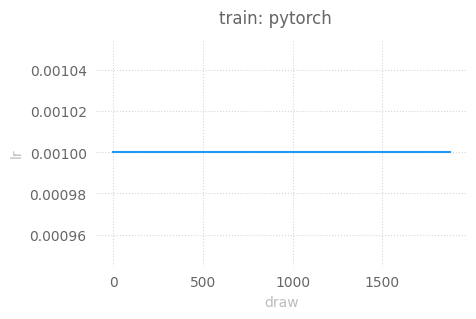

In [62]:
import warnings
import seaborn as sns

warnings.filterwarnings('ignore')
with sns.plotting_context("talk"):
    outputs['pytorch']['train'] = ptExpU1.train(beta=[5., 6.])

15:34:28 WARNING  x.shape (original): torch.Size([2048, 2, 16, 16])                                       ]8;id=555914;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=20237;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#187\187]8;;\

         WARNING  x[:nchains].shape: torch.Size([128, 2, 16, 16])                                         ]8;id=987208;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=532783;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#187\187]8;;\

         INFO     eps=None                                                                                ]8;id=74017;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=349710;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#675\675]8;;\
                  beta=5.0                                                                                              
                  nlog=10                                                                                               
                  table=<rich.table.Table object at 0x7f8b6d4d6fa0>                                                     
                  nprint=100                                                                                            
                  eval_steps=2000                                                                                       
                  nleapfrog=None                                                                                        

Output()

         INFO     estep=0   dt=0.4743 beta=5.0000 loss=-546.4913 dQsin=1.7356 dQint=4.2578                ]8;id=150752;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=495794;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#780\780]8;;\
                  energy=1554.6940 logprob=1554.1252 logdet=0.5686 sldf=4.5110 sldb=-4.4028 sld=0.5686                  
                  xeps=0.2380 veps=0.1702 acc=0.8876 sumlogdet=0.0712 acc_mask=0.8750 plaqs=-0.0022                     
                  intQ=-0.7734 sinQ=-0.0346                                                                             

15:34:42 INFO     estep=100 dt=0.1370 beta=5.0000 loss=1.4961 dQsin=0.1137 dQint=0.0547 energy=404.6169   ]8;id=689286;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=395677;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#780\780]8;;\
                  logprob=404.1284 logdet=0.4886 sldf=4.1612 sldb=-4.1112 sld=0.4886 xeps=0.2380                        
                  veps=0.1702 acc=0.4370 sumlogdet=-0.0116 acc_mask=0.4141 plaqs=0.8943 intQ=-0.0234                    
                  sinQ=-0.0188                                                                                          

15:34:56 INFO     estep=200 dt=0.1344 beta=5.0000 loss=3.3508 dQsin=0.1258 dQint=0.0703 energy=407.0876   ]8;id=175230;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=56806;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#780\780]8;;\
                  logprob=406.5634 logdet=0.5242 sldf=4.2368 sldb=-4.1114 sld=0.5242 xeps=0.2380                        
                  veps=0.1702 acc=0.4256 sumlogdet=0.0641 acc_mask=0.4453 plaqs=0.8937 intQ=-0.0703                     
                  sinQ=-0.0558                                                                                          

15:35:11 INFO     estep=300 dt=0.1350 beta=5.0000 loss=2.9855 dQsin=0.1433 dQint=0.1094 energy=405.3988   ]8;id=79937;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=616068;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#780\780]8;;\
                  logprob=404.9011 logdet=0.4978 sldf=4.1573 sldb=-4.0946 sld=0.4978 xeps=0.2380                        
                  veps=0.1702 acc=0.3990 sumlogdet=0.0333 acc_mask=0.4219 plaqs=0.8943 intQ=0.0000                      
                  sinQ=0.0268                                                                                           

15:35:25 INFO     estep=400 dt=0.1359 beta=5.0000 loss=4.7263 dQsin=0.1390 dQint=0.1094 energy=406.1658   ]8;id=520703;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=171969;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#780\780]8;;\
                  logprob=405.7261 logdet=0.4398 sldf=4.1495 sldb=-4.2077 sld=0.4398 xeps=0.2380                        
                  veps=0.1702 acc=0.3957 sumlogdet=-0.0196 acc_mask=0.3984 plaqs=0.8938 intQ=-0.1797                    
                  sinQ=-0.1484                                                                                          

15:35:39 INFO     estep=500 dt=0.1367 beta=5.0000 loss=1.9489 dQsin=0.1569 dQint=0.1016 energy=407.6118   ]8;id=78980;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=584403;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#780\780]8;;\
                  logprob=407.1273 logdet=0.4845 sldf=4.1583 sldb=-4.1079 sld=0.4845 xeps=0.2380                        
                  veps=0.1702 acc=0.4322 sumlogdet=0.0407 acc_mask=0.4531 plaqs=0.8937 intQ=0.0313                      
                  sinQ=0.0258                                                                                           

15:35:54 INFO     estep=600 dt=0.1362 beta=5.0000 loss=-1.4661 dQsin=0.1418 dQint=0.1094 energy=409.9280  ]8;id=225542;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=151252;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#780\780]8;;\
                  logprob=409.4694 logdet=0.4586 sldf=4.2533 sldb=-4.2884 sld=0.4586 xeps=0.2380                        
                  veps=0.1702 acc=0.4014 sumlogdet=-0.0246 acc_mask=0.3984 plaqs=0.8941 intQ=0.0156                     
                  sinQ=0.0065                                                                                           

15:36:08 INFO     estep=700 dt=0.1387 beta=5.0000 loss=-3.8563 dQsin=0.1358 dQint=0.1016 energy=405.4784  ]8;id=28446;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=982837;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#780\780]8;;\
                  logprob=405.0126 logdet=0.4658 sldf=4.1366 sldb=-4.1331 sld=0.4658 xeps=0.2380                        
                  veps=0.1702 acc=0.4128 sumlogdet=0.0387 acc_mask=0.3516 plaqs=0.8950 intQ=0.0938                      
                  sinQ=0.0789                                                                                           

15:36:22 INFO     estep=800 dt=0.1367 beta=5.0000 loss=0.4693 dQsin=0.1648 dQint=0.1484 energy=409.1087   ]8;id=363049;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=808431;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#780\780]8;;\
                  logprob=408.6178 logdet=0.4909 sldf=4.0924 sldb=-4.0251 sld=0.4909 xeps=0.2380                        
                  veps=0.1702 acc=0.3995 sumlogdet=0.0028 acc_mask=0.3984 plaqs=0.8931 intQ=0.0547                      
                  sinQ=0.0675                                                                                           

15:36:36 INFO     estep=900 dt=0.1364 beta=5.0000 loss=-0.0052 dQsin=0.1284 dQint=0.0938 energy=406.3840  ]8;id=116275;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=555413;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#780\780]8;;\
                  logprob=405.8974 logdet=0.4866 sldf=4.1934 sldb=-4.1423 sld=0.4866 xeps=0.2380                        
                  veps=0.1702 acc=0.3776 sumlogdet=-0.0044 acc_mask=0.3750 plaqs=0.8942 intQ=0.0234                     
                  sinQ=0.0258                                                                                           

15:36:51 INFO     estep=1000 dt=0.1366 beta=5.0000 loss=7.5257 dQsin=0.1071 dQint=0.0781 energy=406.2028  ]8;id=148088;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=703072;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#780\780]8;;\
                  logprob=405.7113 logdet=0.4914 sldf=4.2120 sldb=-4.1753 sld=0.4914 xeps=0.2380                        
                  veps=0.1702 acc=0.4103 sumlogdet=0.0215 acc_mask=0.3906 plaqs=0.8934 intQ=-0.0391                     
                  sinQ=-0.0314                                                                                          

15:37:19 INFO     estep=1200 dt=0.1365 beta=5.0000 loss=2.8506 dQsin=0.1199 dQint=0.0859 energy=408.9140  ]8;id=41512;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=436470;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#780\780]8;;\
                  logprob=408.4417 logdet=0.4723 sldf=4.2741 sldb=-4.2818 sld=0.4723 xeps=0.2380                        
                  veps=0.1702 acc=0.3984 sumlogdet=-0.0214 acc_mask=0.3828 plaqs=0.8930 intQ=0.0859                     
                  sinQ=0.0882                                                                                           

15:37:33 INFO     estep=1300 dt=0.1364 beta=5.0000 loss=-2.1560 dQsin=0.1464 dQint=0.1172 energy=408.0706 ]8;id=290228;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=694562;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#780\780]8;;\
                  logprob=407.6132 logdet=0.4574 sldf=4.1431 sldb=-4.1526 sld=0.4574 xeps=0.2380                        
                  veps=0.1702 acc=0.3912 sumlogdet=0.0207 acc_mask=0.3828 plaqs=0.8922 intQ=0.0156                      
                  sinQ=-0.0054                                                                                          

15:37:48 INFO     estep=1400 dt=0.2844 beta=5.0000 loss=-0.7409 dQsin=0.1159 dQint=0.0859 energy=404.6990 ]8;id=845689;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=42157;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#780\780]8;;\
                  logprob=404.2385 logdet=0.4605 sldf=4.1009 sldb=-4.1156 sld=0.4605 xeps=0.2380                        
                  veps=0.1702 acc=0.3919 sumlogdet=0.0299 acc_mask=0.3672 plaqs=0.8943 intQ=0.0391                      
                  sinQ=0.0388                                                                                           

15:38:03 INFO     estep=1500 dt=0.1399 beta=5.0000 loss=0.2914 dQsin=0.1315 dQint=0.1016 energy=405.3620  ]8;id=185957;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=284867;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#780\780]8;;\
                  logprob=404.9050 logdet=0.4570 sldf=4.1727 sldb=-4.2003 sld=0.4570 xeps=0.2380                        
                  veps=0.1702 acc=0.4840 sumlogdet=0.0301 acc_mask=0.4609 plaqs=0.8925 intQ=-0.2578                     
                  sinQ=-0.2166                                                                                          

15:38:17 INFO     estep=1600 dt=0.1400 beta=5.0000 loss=3.4693 dQsin=0.1343 dQint=0.1016 energy=406.6114  ]8;id=162078;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=314858;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#780\780]8;;\
                  logprob=406.1357 logdet=0.4757 sldf=4.1754 sldb=-4.1533 sld=0.4757 xeps=0.2380                        
                  veps=0.1702 acc=0.4423 sumlogdet=-0.0337 acc_mask=0.4766 plaqs=0.8928 intQ=-0.0391                    
                  sinQ=-0.0232                                                                                          

15:39:22 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=590459;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=404942;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#900\900]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-07-145603/pytorch/eval/plots/ridgeplo                    
                  ts/svgs/energy_ridgeplot.svg                                                                          

15:39:30 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=801383;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=366574;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#900\900]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-07-145603/pytorch/eval/plots/ridgeplo                    
                  ts/svgs/logprob_ridgeplot.svg                                                                         

15:39:37 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=519943;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=358306;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#900\900]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-07-145603/pytorch/eval/plots/ridgeplo                    
                  ts/svgs/logdet_ridgeplot.svg                                                                          

15:39:45 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=611173;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=856123;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#900\900]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-07-145603/pytorch/eval/plots/ridgeplo                    
                  ts/svgs/sldf_ridgeplot.svg                                                                            

15:39:53 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=490858;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=499053;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#900\900]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-07-145603/pytorch/eval/plots/ridgeplo                    
                  ts/svgs/sldb_ridgeplot.svg                                                                            

15:40:01 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=47531;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=820919;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#900\900]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-07-145603/pytorch/eval/plots/ridgeplo                    
                  ts/svgs/sld_ridgeplot.svg                                                                             

15:40:14 INFO     Saving dataset to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc- ]8;id=978278;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py\common.py]8;;\:]8;id=493711;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py#318\318]8;;\
                  qcd/src/l2hmc/notebooks/outputs/2022-11-07-145603/pytorch/eval/data/eval_data.h5                      

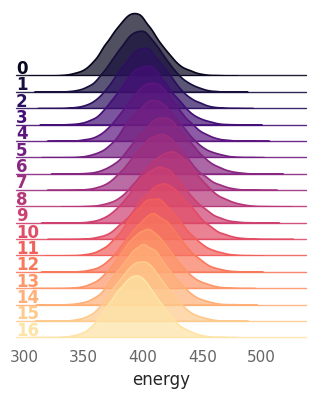

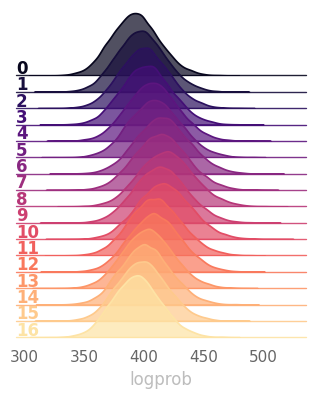

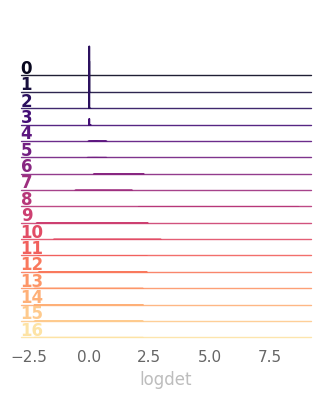

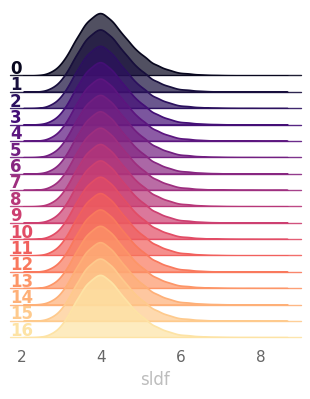

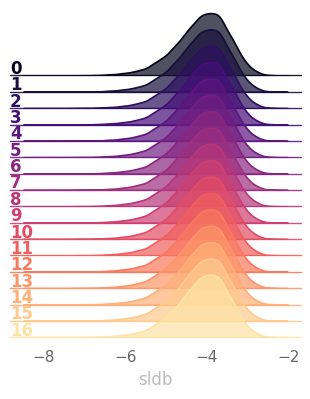

...

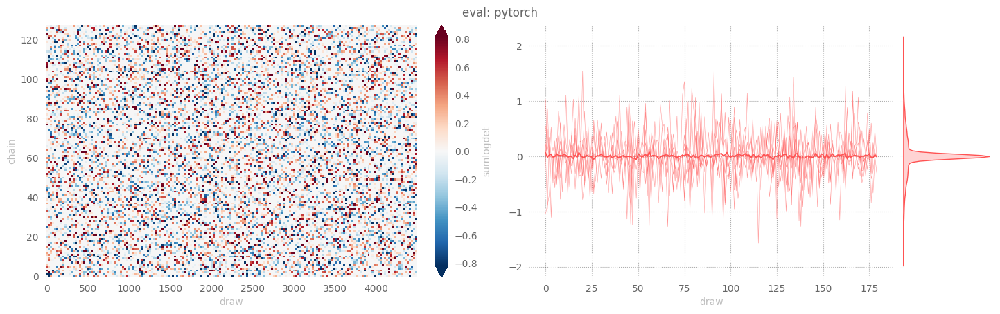

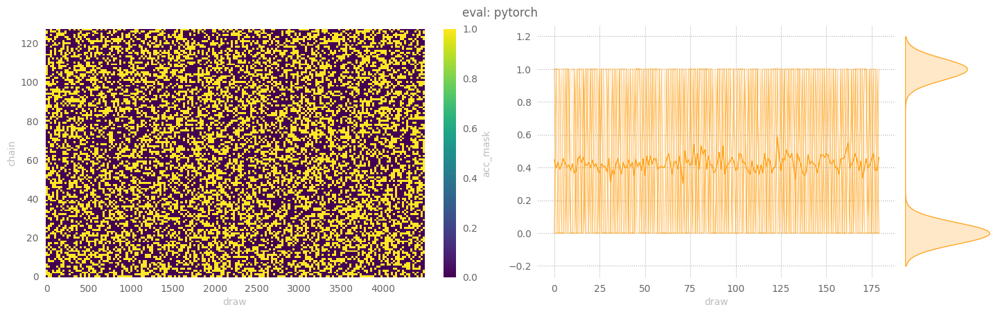

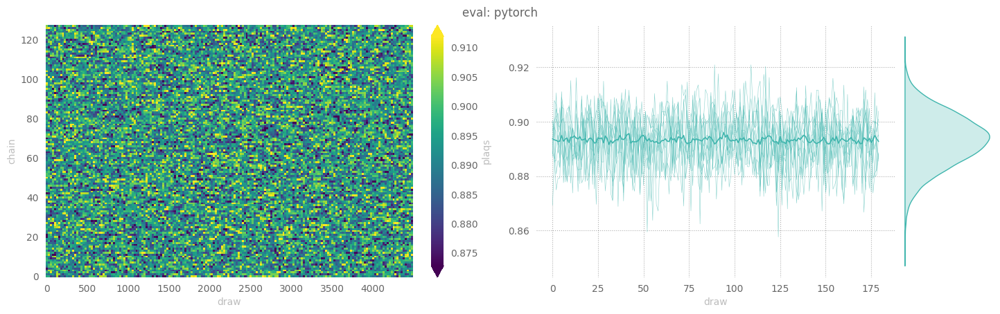

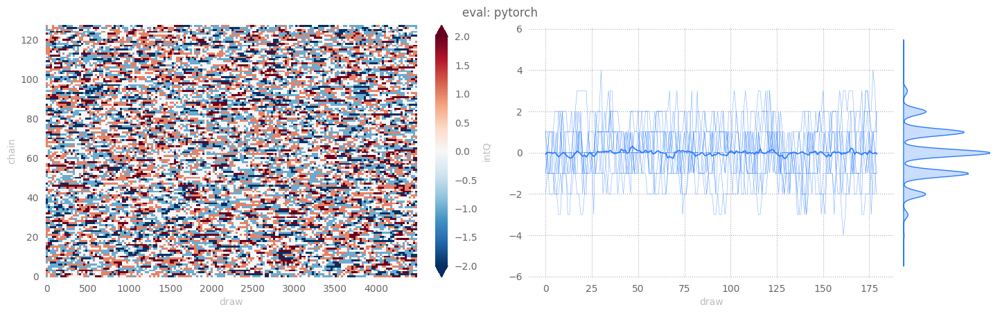

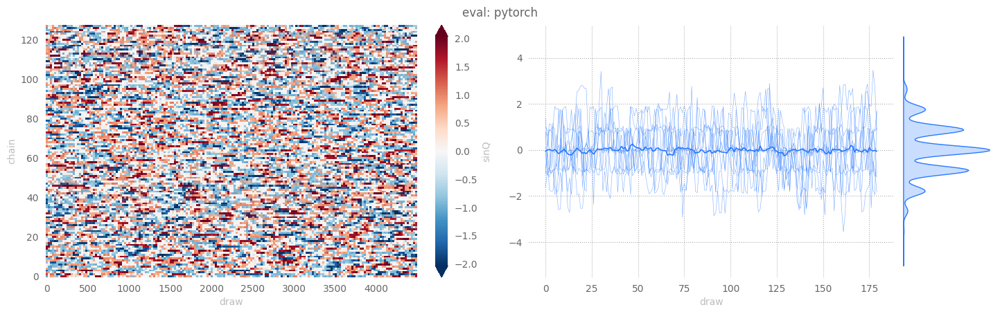

In [13]:
outputs['pytorch']['eval'] = ptExpU1.evaluate(
    job_type='eval',
    nchains=128,
    eval_steps=2000,
    nprint=100,
)

15:40:23 WARNING  Using step size eps: 0.1250 for generic HMC                                             ]8;id=912458;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=623814;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#628\628]8;;\

         WARNING  x.shape (original): torch.Size([2048, 2, 16, 16])                                       ]8;id=924390;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=178227;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#187\187]8;;\

         WARNING  x[:nchains].shape: torch.Size([128, 2, 16, 16])                                         ]8;id=460950;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=769178;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#187\187]8;;\

         INFO     eps=0.125                                                                               ]8;id=819004;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=544433;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#675\675]8;;\
                  beta=5.0                                                                                              
                  nlog=10                                                                                               
                  table=<rich.table.Table object at 0x7f84b81aa520>                                                     
                  nprint=100                                                                                            
                  eval_steps=2000                                                                                       
                  nleapfrog=16                                                                                          

Output()

         INFO     hstep=0   dt=0.0399 beta=5.0000 loss=-640.2590 dQsin=2.0506 dQint=4.9844                ]8;id=854318;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=459142;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#780\780]8;;\
                  energy=1528.1526 logprob=1528.1526 logdet=0.0000 acc=1.0000 sumlogdet=0.0000                          
                  acc_mask=1.0000 plaqs=-0.0060 intQ=-0.0469 sinQ=-0.1703                                               

15:40:26 INFO     hstep=100 dt=0.0235 beta=5.0000 loss=3.7568 dQsin=0.1050 dQint=0.0234 energy=392.8430   ]8;id=310041;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=288401;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#780\780]8;;\
                  logprob=392.8430 logdet=0.0000 acc=0.6316 sumlogdet=0.0000 acc_mask=0.6562 plaqs=0.8926               
                  intQ=-0.1563 sinQ=-0.1435                                                                             

15:40:29 INFO     hstep=200 dt=0.0234 beta=5.0000 loss=7.1277 dQsin=0.0941 dQint=0.0000 energy=391.3254   ]8;id=129894;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=815444;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#780\780]8;;\
                  logprob=391.3254 logdet=0.0000 acc=0.6272 sumlogdet=0.0000 acc_mask=0.6875 plaqs=0.8930               
                  intQ=0.0313 sinQ=0.0299                                                                               

15:40:32 INFO     hstep=300 dt=0.0236 beta=5.0000 loss=2.1480 dQsin=0.1306 dQint=0.0156 energy=394.3916   ]8;id=194638;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=436548;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#780\780]8;;\
                  logprob=394.3916 logdet=0.0000 acc=0.6488 sumlogdet=0.0000 acc_mask=0.6484 plaqs=0.8921               
                  intQ=0.0547 sinQ=0.0284                                                                               

15:40:34 INFO     hstep=400 dt=0.0261 beta=5.0000 loss=7.1368 dQsin=0.1110 dQint=0.0313 energy=391.1054   ]8;id=457241;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=806420;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#780\780]8;;\
                  logprob=391.1054 logdet=0.0000 acc=0.6305 sumlogdet=0.0000 acc_mask=0.6719 plaqs=0.8928               
                  intQ=-0.0234 sinQ=-0.0178                                                                             

15:40:37 INFO     hstep=500 dt=0.0236 beta=5.0000 loss=6.9909 dQsin=0.0808 dQint=0.0000 energy=393.2878   ]8;id=125270;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=984713;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#780\780]8;;\
                  logprob=393.2878 logdet=0.0000 acc=0.6050 sumlogdet=0.0000 acc_mask=0.5469 plaqs=0.8934               
                  intQ=0.0703 sinQ=0.0440                                                                               

15:40:40 INFO     hstep=600 dt=0.0237 beta=5.0000 loss=5.0484 dQsin=0.0836 dQint=0.0156 energy=395.0954   ]8;id=555534;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=108100;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#780\780]8;;\
                  logprob=395.0954 logdet=0.0000 acc=0.5786 sumlogdet=0.0000 acc_mask=0.5078 plaqs=0.8934               
                  intQ=-0.0625 sinQ=-0.0559                                                                             

15:40:42 INFO     hstep=700 dt=0.0263 beta=5.0000 loss=2.9253 dQsin=0.1130 dQint=0.0156 energy=392.1280   ]8;id=869711;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=881401;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#780\780]8;;\
                  logprob=392.1280 logdet=0.0000 acc=0.6674 sumlogdet=0.0000 acc_mask=0.6562 plaqs=0.8919               
                  intQ=-0.0547 sinQ=-0.0546                                                                             

15:40:45 INFO     hstep=800 dt=0.0239 beta=5.0000 loss=5.8508 dQsin=0.1026 dQint=0.0156 energy=393.2186   ]8;id=508770;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=395124;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#780\780]8;;\
                  logprob=393.2186 logdet=0.0000 acc=0.6066 sumlogdet=0.0000 acc_mask=0.5547 plaqs=0.8933               
                  intQ=0.0625 sinQ=0.0348                                                                               

15:40:47 INFO     hstep=900 dt=0.0264 beta=5.0000 loss=8.0260 dQsin=0.1131 dQint=0.0234 energy=395.8152   ]8;id=857456;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=856439;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#780\780]8;;\
                  logprob=395.8152 logdet=0.0000 acc=0.6102 sumlogdet=0.0000 acc_mask=0.6562 plaqs=0.8924               
                  intQ=0.0000 sinQ=-0.0072                                                                              

15:40:50 INFO     hstep=1000 dt=0.0236 beta=5.0000 loss=7.0930 dQsin=0.1038 dQint=0.0313 energy=393.7804  ]8;id=688276;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=267884;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#780\780]8;;\
                  logprob=393.7804 logdet=0.0000 acc=0.6148 sumlogdet=0.0000 acc_mask=0.6250 plaqs=0.8936               
                  intQ=0.1016 sinQ=0.0785                                                                               

15:40:53 INFO     hstep=1100 dt=0.0239 beta=5.0000 loss=4.0746 dQsin=0.1029 dQint=0.0000 energy=395.3181  ]8;id=672182;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=200711;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#780\780]8;;\
                  logprob=395.3181 logdet=0.0000 acc=0.6880 sumlogdet=0.0000 acc_mask=0.7031 plaqs=0.8923               
                  intQ=0.1250 sinQ=0.1248                                                                               

15:40:55 INFO     hstep=1200 dt=0.0238 beta=5.0000 loss=6.2881 dQsin=0.1106 dQint=0.0156 energy=392.3535  ]8;id=362124;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=113411;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#780\780]8;;\
                  logprob=392.3535 logdet=0.0000 acc=0.6495 sumlogdet=0.0000 acc_mask=0.6328 plaqs=0.8927               
                  intQ=0.1719 sinQ=0.1704                                                                               

15:40:58 INFO     hstep=1300 dt=0.0236 beta=5.0000 loss=4.6604 dQsin=0.1040 dQint=0.0078 energy=392.0242  ]8;id=736791;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=734143;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#780\780]8;;\
                  logprob=392.0242 logdet=0.0000 acc=0.6279 sumlogdet=0.0000 acc_mask=0.6094 plaqs=0.8936               
                  intQ=0.1797 sinQ=0.1606                                                                               

15:41:01 INFO     hstep=1400 dt=0.0237 beta=5.0000 loss=5.3009 dQsin=0.0833 dQint=0.0000 energy=392.8580  ]8;id=849284;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=164804;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#780\780]8;;\
                  logprob=392.8580 logdet=0.0000 acc=0.5813 sumlogdet=0.0000 acc_mask=0.5625 plaqs=0.8945               
                  intQ=0.1484 sinQ=0.1162                                                                               

15:41:03 INFO     hstep=1500 dt=0.0235 beta=5.0000 loss=7.8933 dQsin=0.0973 dQint=0.0391 energy=394.0682  ]8;id=608608;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=952097;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#780\780]8;;\
                  logprob=394.0682 logdet=0.0000 acc=0.6328 sumlogdet=0.0000 acc_mask=0.6562 plaqs=0.8927               
                  intQ=0.1406 sinQ=0.1192                                                                               

15:41:06 INFO     hstep=1600 dt=0.0274 beta=5.0000 loss=3.8614 dQsin=0.1013 dQint=0.0078 energy=392.5845  ]8;id=988809;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=282413;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#780\780]8;;\
                  logprob=392.5845 logdet=0.0000 acc=0.6017 sumlogdet=0.0000 acc_mask=0.5781 plaqs=0.8936               
                  intQ=0.1250 sinQ=0.1170                                                                               

15:41:09 INFO     hstep=1700 dt=0.0237 beta=5.0000 loss=5.9079 dQsin=0.1113 dQint=0.0234 energy=392.1127  ]8;id=162368;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=889115;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#780\780]8;;\
                  logprob=392.1127 logdet=0.0000 acc=0.6573 sumlogdet=0.0000 acc_mask=0.6719 plaqs=0.8926               
                  intQ=0.0469 sinQ=0.0335                                                                               

15:41:14 INFO     hstep=1900 dt=0.0242 beta=5.0000 loss=6.1645 dQsin=0.1135 dQint=0.0156 energy=390.8998  ]8;id=339203;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py\trainer.py]8;;\:]8;id=832110;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/pytorch/trainer.py#780\780]8;;\
                  logprob=390.8998 logdet=0.0000 acc=0.6532 sumlogdet=0.0000 acc_mask=0.6562 plaqs=0.8936               
                  intQ=-0.1641 sinQ=-0.1308                                                                             

15:41:23 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=825218;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=468368;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#900\900]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-07-145603/pytorch/hmc/plots/ridgeplot                    
                  s/svgs/energy_ridgeplot.svg                                                                           

15:41:30 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=755692;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=74211;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#900\900]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-07-145603/pytorch/hmc/plots/ridgeplot                    
                  s/svgs/logprob_ridgeplot.svg                                                                          

15:41:36 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=82304;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=414442;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#900\900]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-07-145603/pytorch/hmc/plots/ridgeplot                    
                  s/svgs/logdet_ridgeplot.svg                                                                           

15:41:46 INFO     Saving dataset to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc- ]8;id=224552;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py\common.py]8;;\:]8;id=50054;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py#318\318]8;;\
                  qcd/src/l2hmc/notebooks/outputs/2022-11-07-145603/pytorch/hmc/data/hmc_data.h5                        

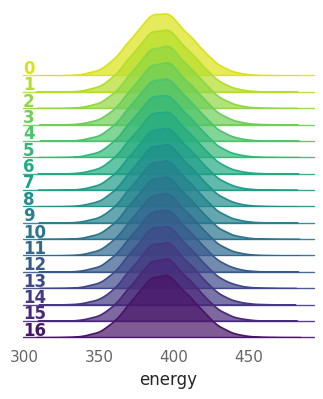

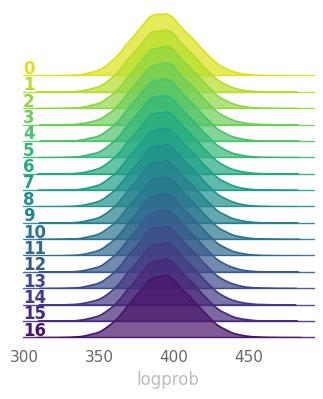

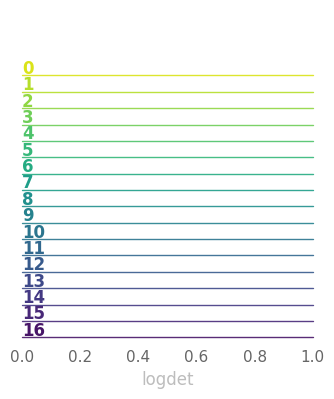

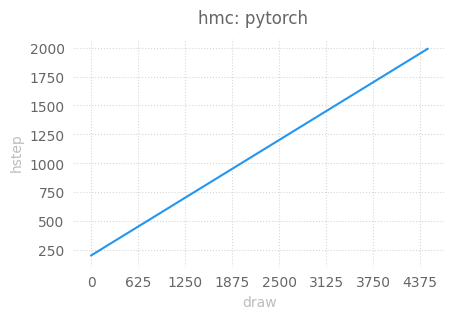

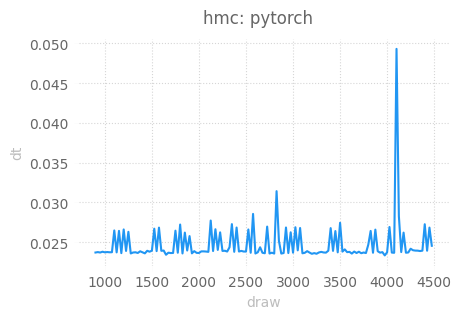

...

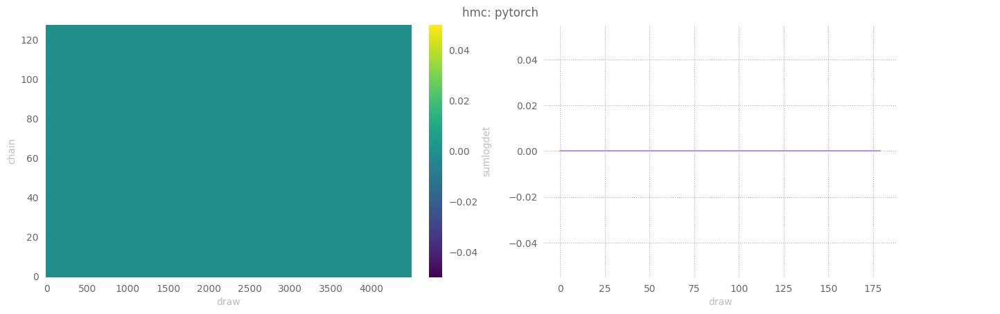

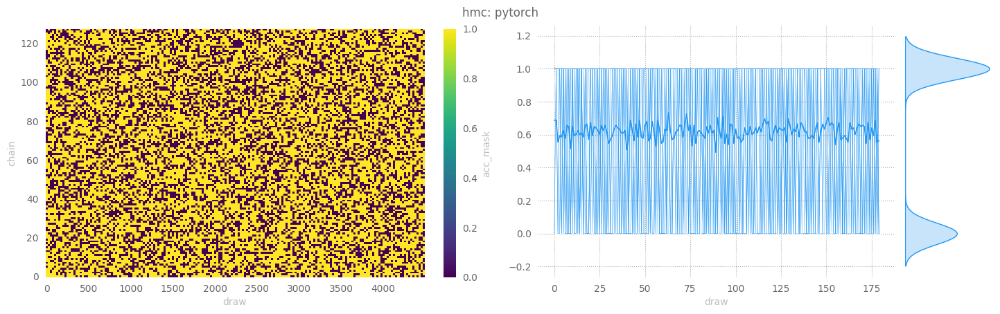

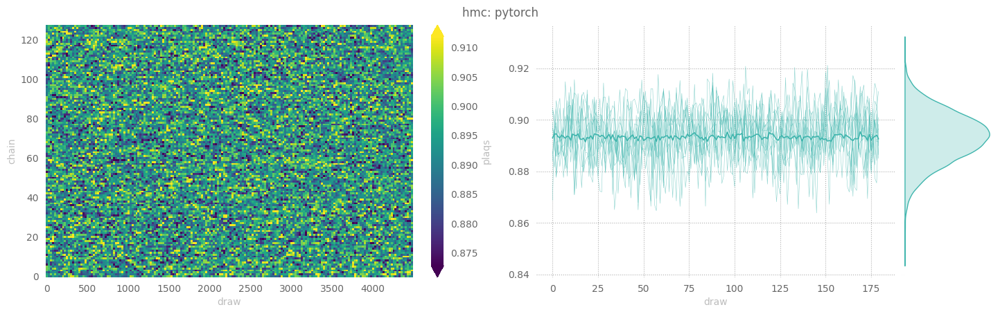

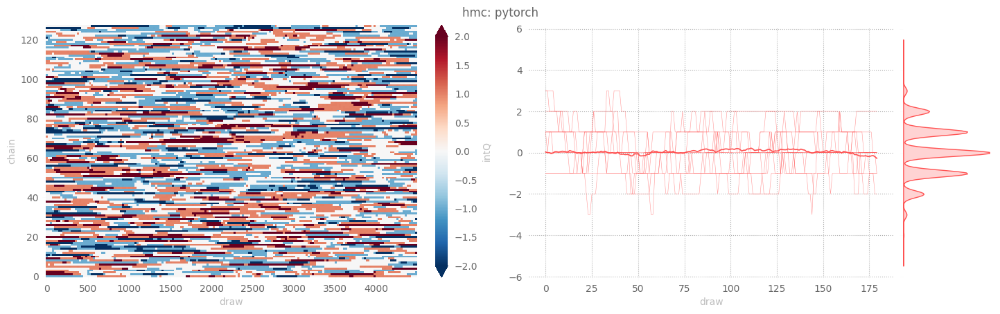

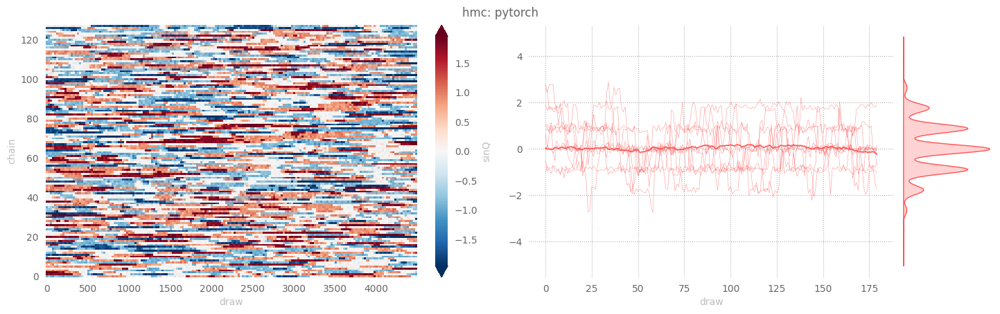

In [14]:
outputs['pytorch']['hmc'] = ptExpU1.evaluate(
    job_type='hmc',
    nchains=128,
    eval_steps=2000,
    nprint=100,
)

## TensorFlow

15:41:55 INFO     Looking for checkpoints in: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/proje ]8;id=300032;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=39840;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#237\237]8;;\
                  cts/l2hmc-qcd/src/l2hmc/checkpoints/U1/2-16-16/nlf-8/xsplit-True/sepnets-True/merge-Tru               
                  e/4-8-16-32_4-4-4-4_2-2-2-2/16-16-16-16_dp-0.0_bn-False/tensorflow                                    

         WARNING  Restored checkpoint from: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/project ]8;id=230048;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=869921;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#247\247]8;;\
                  s/l2hmc-qcd/src/l2hmc/checkpoints/U1/2-16-16/nlf-8/xsplit-True/sepnets-True/merge-True/               
                  4-8-16-32_4-4-4-4_2-2-2-2/16-16-16-16_dp-0.0_bn-False/tensorflow/ckpt-17                              

─────────────────────────────────────────────── ERA: 0 / 2, BETA: 4.000 ────────────────────────────────────────────────

Output()

15:53:55 INFO     Saving took: 0.940432s                                                                 ]8;id=984580;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=332383;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#1004\1004]8;;\

         INFO     Checkpoint saved to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2 ]8;id=320470;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=483219;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#1005\1005]8;;\
                  hmc-qcd/src/l2hmc/checkpoints/U1/2-16-16/nlf-8/xsplit-True/sepnets-True/merge-True/4-8                
                  -16-32_4-4-4-4_2-2-2-2/16-16-16-16_dp-0.0_bn-False/tensorflow                                         

         INFO     Era 0 took: 719.956s                                                                   ]8;id=69444;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=269933;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#1006\1006]8;;\

─────────────────────────────────────────────── ERA: 1 / 2, BETA: 5.000 ────────────────────────────────────────────────

Output()

15:59:54 INFO     era=1   epoch=250 tstep=6250.0000 dt=1.2463 beta=5.0000 loss=0.2355 dQsin=0.1369        ]8;id=898112;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=76545;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#829\829]8;;\
                  dQint=0.0835 energy=401.5301 logprob=401.5300 logdet=0.0002 sldf=0.0003 sldb=-0.0001                  
                  sld=0.0002 xeps=0.2196 veps=0.1741 acc=0.5004 sumlogdet=-0.0000 acc_mask=0.5000                       
                  plaqs=0.8935 intQ=0.0317 sinQ=0.0263 lr=0.0010                                                        

16:05:52 INFO     Saving took: 0.736256s                                                                 ]8;id=722293;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=447012;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#1004\1004]8;;\

         INFO     Checkpoint saved to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2 ]8;id=995628;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=211704;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#1005\1005]8;;\
                  hmc-qcd/src/l2hmc/checkpoints/U1/2-16-16/nlf-8/xsplit-True/sepnets-True/merge-True/4-8                
                  -16-32_4-4-4-4_2-2-2-2/16-16-16-16_dp-0.0_bn-False/tensorflow                                         

         INFO     Era 1 took: 716.945s                                                                   ]8;id=106213;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=415914;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#1006\1006]8;;\

16:06:10 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=204055;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=739099;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#900\900]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-07-145843/tensorflow/train/plots/ridg                    
                  eplots/svgs/energy_ridgeplot.svg                                                                      

16:06:30 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=929506;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=930457;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#900\900]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-07-145843/tensorflow/train/plots/ridg                    
                  eplots/svgs/logprob_ridgeplot.svg                                                                     

16:06:51 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=481894;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=524830;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#900\900]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-07-145843/tensorflow/train/plots/ridg                    
                  eplots/svgs/logdet_ridgeplot.svg                                                                      

16:07:11 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=247807;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=858292;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#900\900]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-07-145843/tensorflow/train/plots/ridg                    
                  eplots/svgs/sldf_ridgeplot.svg                                                                        

16:07:30 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=836294;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=378802;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#900\900]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-07-145843/tensorflow/train/plots/ridg                    
                  eplots/svgs/sldb_ridgeplot.svg                                                                        

16:07:51 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=976250;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=900397;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#900\900]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-07-145843/tensorflow/train/plots/ridg                    
                  eplots/svgs/sld_ridgeplot.svg                                                                         

16:08:05 INFO     Saving dataset to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc- ]8;id=215042;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py\common.py]8;;\:]8;id=540052;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py#318\318]8;;\
                  qcd/src/l2hmc/notebooks/outputs/2022-11-07-145843/tensorflow/train/data/train_data.h5                 

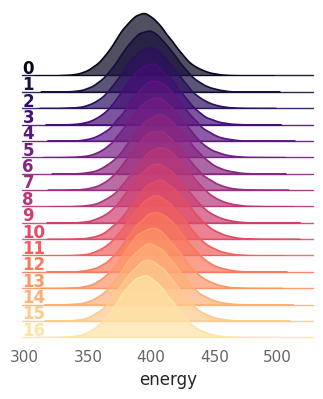

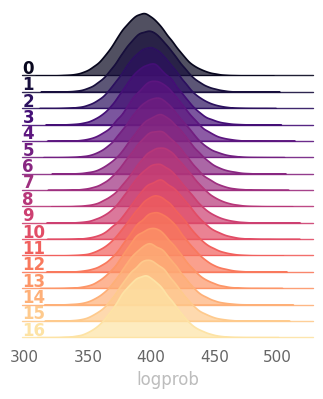

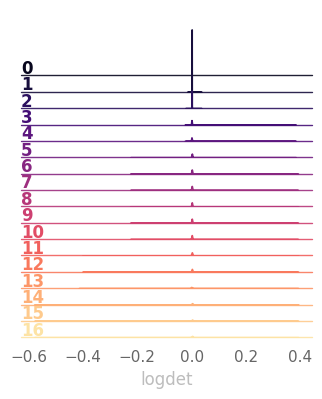

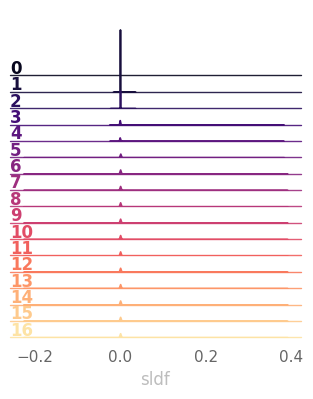

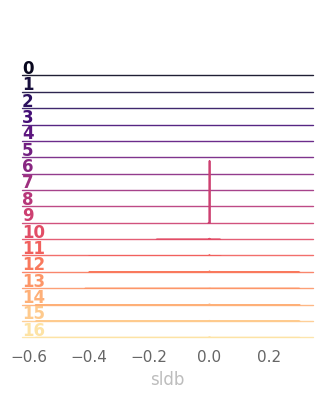

...

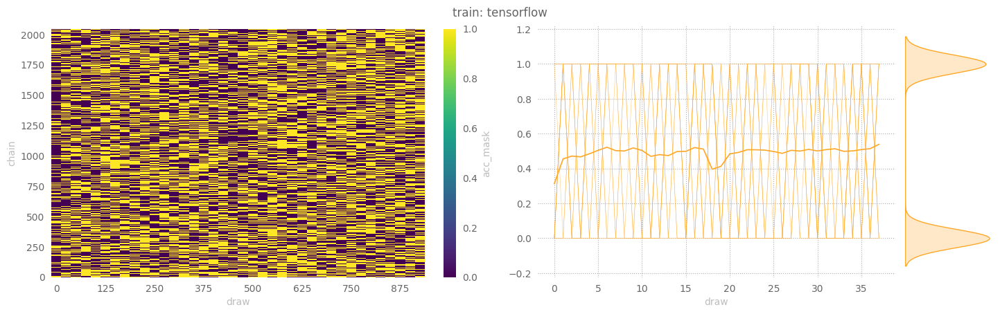

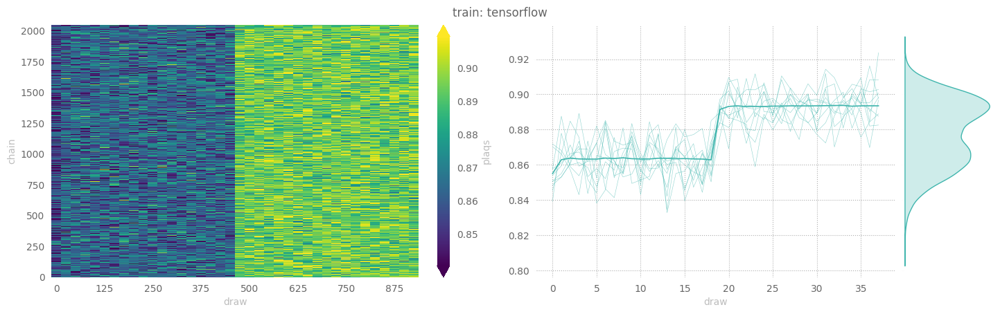

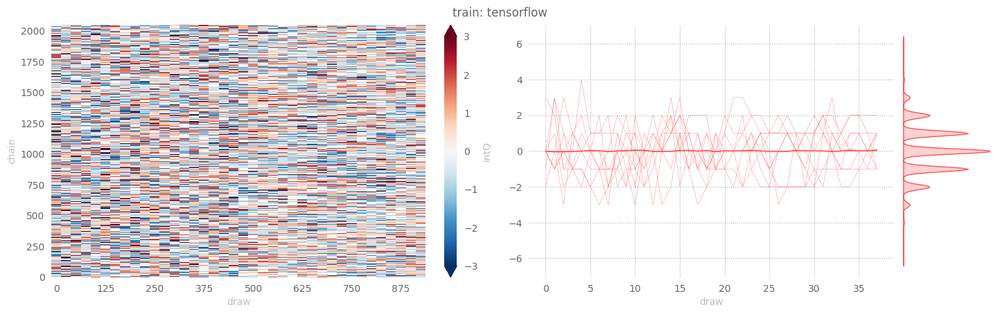

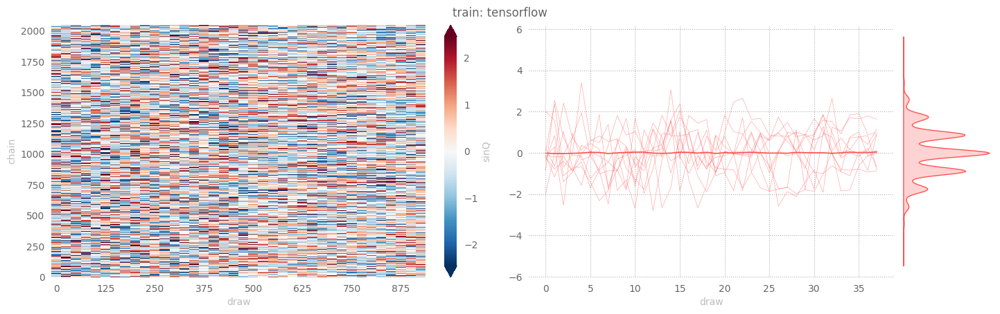

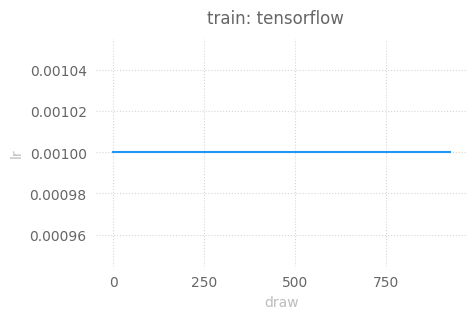

In [15]:
import seaborn as sns
warnings.filterwarnings('ignore')
with sns.plotting_context("talk"):
    outputs['tensorflow']['train'] = tfExpU1.train()

16:12:07 WARNING  x.shape (original): (2048, 2, 16, 16)                                                   ]8;id=932891;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=441632;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#497\497]8;;\

         WARNING  x[:nchains].shape: (128, 2, 16, 16)                                                     ]8;id=183175;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=612905;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#503\503]8;;\

         INFO     eps = None                                                                              ]8;id=213133;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=63240;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#536\536]8;;\
                  beta = 5.0                                                                                            
                  nlog = 10                                                                                             
                  table = <rich.table.Table object at 0x7f89df728670>                                                   
                  nprint = 100                                                                                          
                  eval_steps = 2000                                                                                     
                  nleapfrog = None                                                                                      

16:12:08 INFO     estep=0   dt=1.1199 beta=5.0000 loss=-488.2532 dQsin=1.6091 dQint=3.6328                ]8;id=852336;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=560296;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  energy=1546.6769 logprob=1546.6769 logdet=0.0000 sldf=0.0003 sldb=-0.0003 sld=0.0000                  
                  xeps=0.2166 veps=0.1714 acc=0.8279 sumlogdet=-0.0006 acc_mask=0.8359 plaqs=-0.0028                    
                  intQ=0.2812 sinQ=0.1182                                                                               

16:13:02 INFO     estep=100 dt=0.5270 beta=5.0000 loss=6.8828 dQsin=0.1158 dQint=0.0313 energy=399.9785   ]8;id=160495;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=523855;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=399.9785 logdet=0.0000 sldf=0.0000 sldb=0.0000 sld=0.0000 xeps=0.2166                         
                  veps=0.1714 acc=0.4972 sumlogdet=0.0000 acc_mask=0.4922 plaqs=0.8928 intQ=0.0703                      
                  sinQ=0.0656                                                                                           

16:13:56 INFO     estep=200 dt=0.5254 beta=5.0000 loss=0.2341 dQsin=0.1134 dQint=0.0625 energy=401.0778   ]8;id=950492;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=810890;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=401.0778 logdet=-0.0000 sldf=-0.0000 sldb=0.0000 sld=-0.0000 xeps=0.2166                      
                  veps=0.1714 acc=0.4959 sumlogdet=0.0000 acc_mask=0.4922 plaqs=0.8934 intQ=0.0000                      
                  sinQ=0.0188                                                                                           

16:14:49 INFO     estep=300 dt=0.5231 beta=5.0000 loss=1.6840 dQsin=0.1661 dQint=0.1094 energy=402.5847   ]8;id=997075;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=575700;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=402.5848 logdet=-0.0001 sldf=0.0002 sldb=-0.0003 sld=-0.0001 xeps=0.2166                      
                  veps=0.1714 acc=0.5591 sumlogdet=0.0002 acc_mask=0.5859 plaqs=0.8924 intQ=0.0234                      
                  sinQ=0.0019                                                                                           

16:15:43 INFO     estep=400 dt=0.5223 beta=5.0000 loss=4.3329 dQsin=0.1232 dQint=0.0625 energy=402.1451   ]8;id=495385;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=349970;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=402.1448 logdet=0.0003 sldf=0.0003 sldb=-0.0000 sld=0.0003 xeps=0.2166                        
                  veps=0.1714 acc=0.5560 sumlogdet=0.0001 acc_mask=0.5859 plaqs=0.8933 intQ=-0.0234                     
                  sinQ=-0.0419                                                                                          

16:16:36 INFO     estep=500 dt=0.5223 beta=5.0000 loss=3.8246 dQsin=0.1279 dQint=0.0781 energy=401.9919   ]8;id=145467;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=137293;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=401.9918 logdet=0.0002 sldf=0.0002 sldb=-0.0000 sld=0.0002 xeps=0.2166                        
                  veps=0.1714 acc=0.5299 sumlogdet=0.0001 acc_mask=0.5469 plaqs=0.8931 intQ=0.1875                      
                  sinQ=0.1590                                                                                           

16:17:30 INFO     estep=600 dt=0.5217 beta=5.0000 loss=-0.1008 dQsin=0.1110 dQint=0.0625 energy=403.2085  ]8;id=50407;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=654841;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=403.2084 logdet=0.0001 sldf=0.0001 sldb=0.0000 sld=0.0001 xeps=0.2166                         
                  veps=0.1714 acc=0.4564 sumlogdet=0.0000 acc_mask=0.4297 plaqs=0.8933 intQ=0.0313                      
                  sinQ=0.0284                                                                                           

16:18:23 INFO     estep=700 dt=0.5237 beta=5.0000 loss=-0.2626 dQsin=0.1621 dQint=0.1172 energy=398.8691  ]8;id=173098;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=970295;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=398.8686 logdet=0.0005 sldf=0.0005 sldb=-0.0000 sld=0.0005 xeps=0.2166                        
                  veps=0.1714 acc=0.4988 sumlogdet=-0.0001 acc_mask=0.5469 plaqs=0.8947 intQ=0.2109                     
                  sinQ=0.1570                                                                                           

16:19:17 INFO     estep=800 dt=0.5235 beta=5.0000 loss=2.3491 dQsin=0.1084 dQint=0.0625 energy=404.1078   ]8;id=151968;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=883256;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=404.1079 logdet=-0.0001 sldf=0.0001 sldb=-0.0002 sld=-0.0001 xeps=0.2166                      
                  veps=0.1714 acc=0.4890 sumlogdet=-0.0002 acc_mask=0.5000 plaqs=0.8932 intQ=-0.0156                    
                  sinQ=-0.0087                                                                                          

16:20:11 INFO     estep=900 dt=0.5231 beta=5.0000 loss=4.0604 dQsin=0.1130 dQint=0.0703 energy=400.3358   ]8;id=572590;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=73137;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=400.3358 logdet=0.0000 sldf=0.0001 sldb=-0.0001 sld=0.0000 xeps=0.2166                        
                  veps=0.1714 acc=0.4983 sumlogdet=0.0001 acc_mask=0.4844 plaqs=0.8939 intQ=-0.0703                     
                  sinQ=-0.0804                                                                                          

16:21:04 INFO     estep=1000 dt=0.5258 beta=5.0000 loss=0.2778 dQsin=0.1385 dQint=0.0703 energy=401.3635  ]8;id=748472;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=341086;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=401.3634 logdet=0.0001 sldf=0.0001 sldb=-0.0000 sld=0.0001 xeps=0.2166                        
                  veps=0.1714 acc=0.5071 sumlogdet=-0.0001 acc_mask=0.5234 plaqs=0.8933 intQ=-0.0547                    
                  sinQ=-0.0545                                                                                          

16:21:57 INFO     estep=1100 dt=0.5241 beta=5.0000 loss=4.4214 dQsin=0.1110 dQint=0.0469 energy=399.7753  ]8;id=179331;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=1789;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=399.7755 logdet=-0.0002 sldf=-0.0000 sldb=-0.0001 sld=-0.0002 xeps=0.2166                     
                  veps=0.1714 acc=0.4930 sumlogdet=-0.0001 acc_mask=0.4922 plaqs=0.8931 intQ=0.1172                     
                  sinQ=0.1083                                                                                           

16:22:50 INFO     estep=1200 dt=0.5239 beta=5.0000 loss=3.3770 dQsin=0.1343 dQint=0.0703 energy=399.8777  ]8;id=700700;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=707471;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=399.8771 logdet=0.0006 sldf=0.0007 sldb=-0.0001 sld=0.0006 xeps=0.2166                        
                  veps=0.1714 acc=0.5019 sumlogdet=0.0010 acc_mask=0.4844 plaqs=0.8928 intQ=-0.0469                     
                  sinQ=-0.0300                                                                                          

16:23:44 INFO     estep=1300 dt=0.5229 beta=5.0000 loss=4.2904 dQsin=0.1080 dQint=0.0391 energy=399.2124  ]8;id=63779;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=669285;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=399.2125 logdet=-0.0001 sldf=0.0002 sldb=-0.0003 sld=-0.0001 xeps=0.2166                      
                  veps=0.1714 acc=0.5256 sumlogdet=-0.0008 acc_mask=0.4922 plaqs=0.8942 intQ=-0.0312                    
                  sinQ=-0.0328                                                                                          

16:24:38 INFO     estep=1400 dt=0.5263 beta=5.0000 loss=-0.2402 dQsin=0.1248 dQint=0.0781 energy=400.0410 ]8;id=91876;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=794724;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=400.0405 logdet=0.0004 sldf=0.0004 sldb=-0.0000 sld=0.0004 xeps=0.2166                        
                  veps=0.1714 acc=0.5156 sumlogdet=0.0004 acc_mask=0.5078 plaqs=0.8935 intQ=0.0391                      
                  sinQ=0.0234                                                                                           

16:25:31 INFO     estep=1500 dt=0.5220 beta=5.0000 loss=7.0420 dQsin=0.1084 dQint=0.0391 energy=401.1136  ]8;id=830580;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=155476;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=401.1136 logdet=0.0001 sldf=0.0001 sldb=-0.0001 sld=0.0001 xeps=0.2166                        
                  veps=0.1714 acc=0.5582 sumlogdet=-0.0001 acc_mask=0.6094 plaqs=0.8940 intQ=0.0078                     
                  sinQ=0.0016                                                                                           

16:26:25 INFO     estep=1600 dt=0.5215 beta=5.0000 loss=1.6391 dQsin=0.1626 dQint=0.1016 energy=402.7141  ]8;id=960003;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=227576;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=402.7141 logdet=-0.0000 sldf=-0.0000 sldb=-0.0000 sld=-0.0000 xeps=0.2166                     
                  veps=0.1714 acc=0.4954 sumlogdet=-0.0001 acc_mask=0.5391 plaqs=0.8931 intQ=-0.0234                    
                  sinQ=-0.0331                                                                                          

16:27:18 INFO     estep=1700 dt=0.5219 beta=5.0000 loss=4.4102 dQsin=0.1031 dQint=0.0391 energy=401.7003  ]8;id=41850;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=453794;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=401.6996 logdet=0.0006 sldf=0.0007 sldb=-0.0001 sld=0.0006 xeps=0.2166                        
                  veps=0.1714 acc=0.4683 sumlogdet=-0.0002 acc_mask=0.4844 plaqs=0.8939 intQ=-0.3281                    
                  sinQ=-0.2848                                                                                          

16:28:11 INFO     estep=1800 dt=0.5220 beta=5.0000 loss=-0.4793 dQsin=0.1701 dQint=0.1172 energy=401.3477 ]8;id=410455;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=772512;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=401.3471 logdet=0.0007 sldf=0.0006 sldb=0.0000 sld=0.0007 xeps=0.2166                         
                  veps=0.1714 acc=0.5182 sumlogdet=0.0001 acc_mask=0.5156 plaqs=0.8928 intQ=-0.1328                     
                  sinQ=-0.0941                                                                                          

16:29:05 INFO     estep=1900 dt=0.5227 beta=5.0000 loss=-0.4478 dQsin=0.1367 dQint=0.0703 energy=400.1281 ]8;id=340169;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=217180;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=400.1264 logdet=0.0016 sldf=0.0019 sldb=-0.0003 sld=0.0016 xeps=0.2166                        
                  veps=0.1714 acc=0.5030 sumlogdet=0.0010 acc_mask=0.5469 plaqs=0.8943 intQ=0.0156                      
                  sinQ=0.0098                                                                                           

16:30:04 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=862807;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=707484;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#900\900]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-07-145843/tensorflow/eval/plots/ridge                    
                  plots/svgs/energy_ridgeplot.svg                                                                       

16:30:12 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=399718;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=981874;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#900\900]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-07-145843/tensorflow/eval/plots/ridge                    
                  plots/svgs/logprob_ridgeplot.svg                                                                      

16:30:20 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=916755;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=959679;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#900\900]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-07-145843/tensorflow/eval/plots/ridge                    
                  plots/svgs/logdet_ridgeplot.svg                                                                       

16:30:28 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=293651;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=563596;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#900\900]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-07-145843/tensorflow/eval/plots/ridge                    
                  plots/svgs/sldf_ridgeplot.svg                                                                         

16:30:35 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=662537;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=965809;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#900\900]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-07-145843/tensorflow/eval/plots/ridge                    
                  plots/svgs/sldb_ridgeplot.svg                                                                         

16:30:43 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=319327;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=442537;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#900\900]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-07-145843/tensorflow/eval/plots/ridge                    
                  plots/svgs/sld_ridgeplot.svg                                                                          

16:30:55 INFO     Saving dataset to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc- ]8;id=334446;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py\common.py]8;;\:]8;id=718557;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py#318\318]8;;\
                  qcd/src/l2hmc/notebooks/outputs/2022-11-07-145843/tensorflow/eval/data/eval_data.h5                   

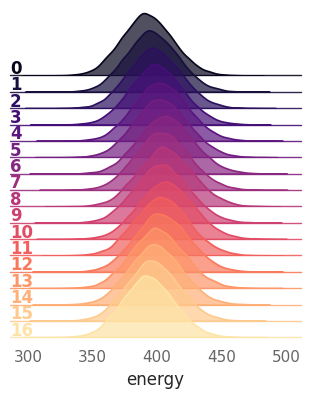

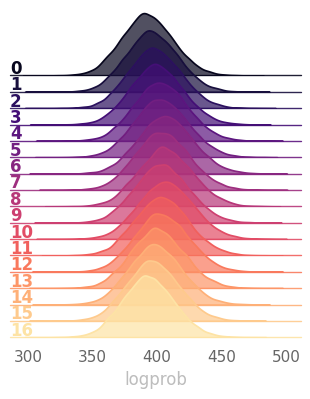

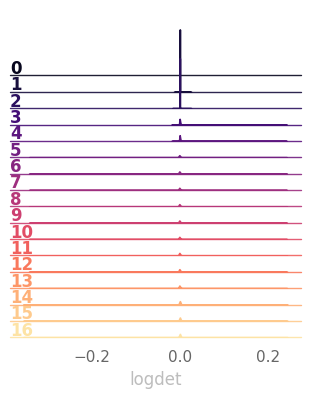

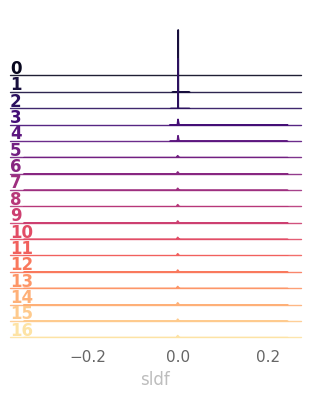

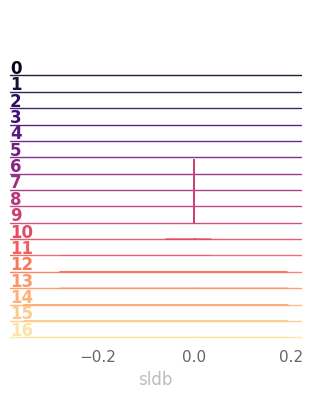

...

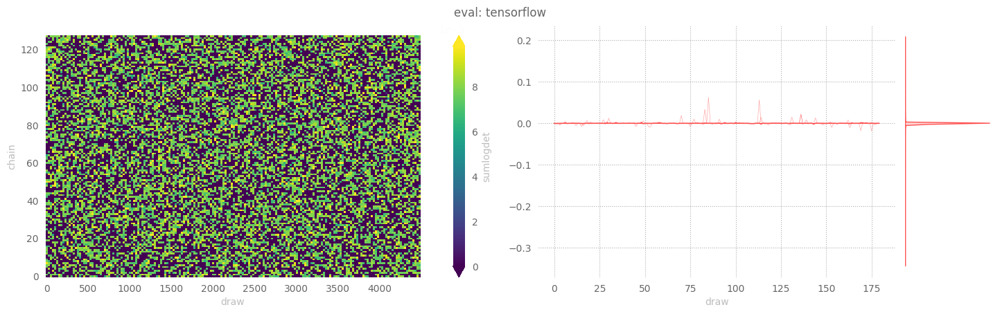

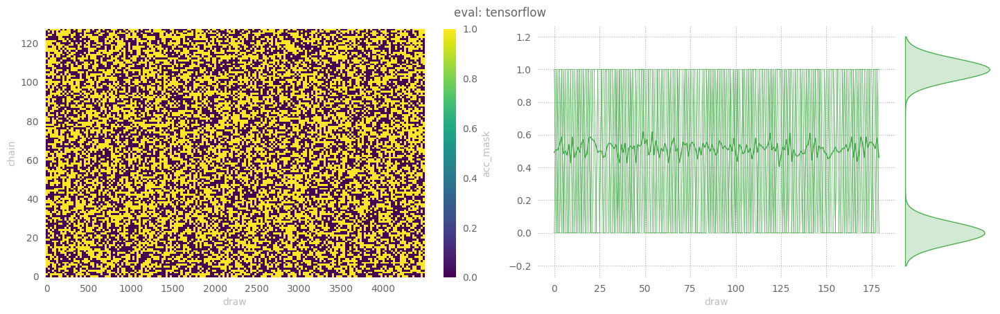

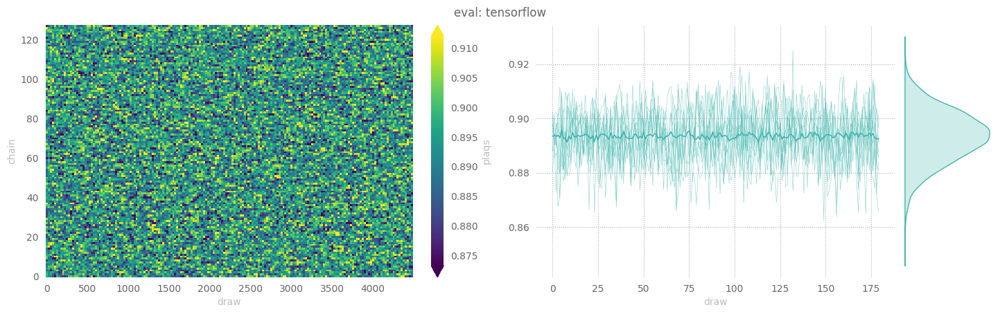

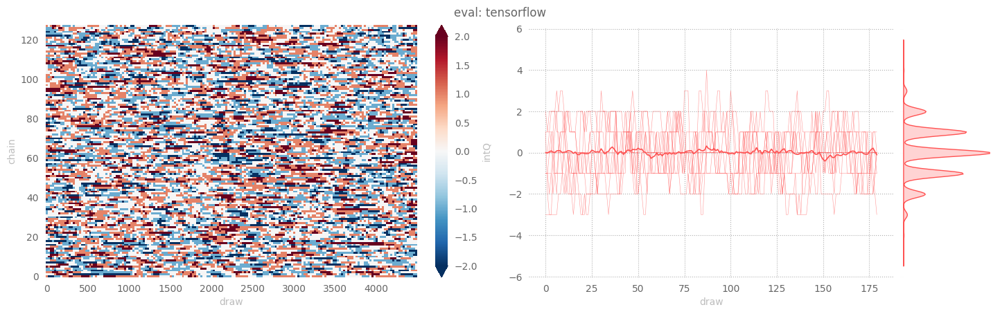

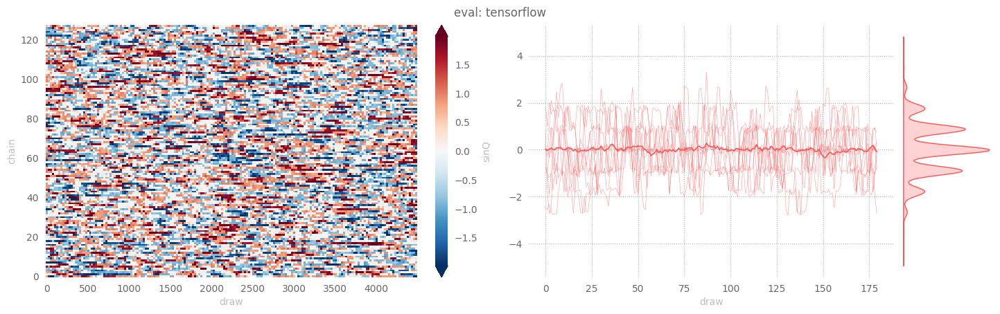

In [16]:
outputs['tensorflow']['eval'] = tfExpU1.evaluate(
    job_type='eval',
    nprint=100,
    nchains=128,
    eval_steps=2000,
)

16:31:05 WARNING  Step size `eps` not specified for HMC! Using default: 0.1250 for generic HMC            ]8;id=605814;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=158772;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#489\489]8;;\

         WARNING  x.shape (original): (2048, 2, 16, 16)                                                   ]8;id=879511;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=558513;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#497\497]8;;\

         WARNING  x[:nchains].shape: (128, 2, 16, 16)                                                     ]8;id=97380;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=801472;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#503\503]8;;\

         INFO     eps = 0.125                                                                             ]8;id=272960;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=291525;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#536\536]8;;\
                  beta = 5.0                                                                                            
                  nlog = 10                                                                                             
                  table = <rich.table.Table object at 0x7f822453c7c0>                                                   
                  nprint = 100                                                                                          
                  eval_steps = 2000                                                                                     
                  nleapfrog = 16                                                                                        

16:31:06 INFO     hstep=0   dt=0.1022 beta=5.0000 loss=-573.1479 dQsin=1.8708 dQint=4.3516                ]8;id=430186;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=419500;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  energy=1518.9844 logprob=1518.9844 logdet=0.0000 acc=1.0000 sumlogdet=0.0000                          
                  acc_mask=1.0000 plaqs=0.0004 intQ=-0.8438 sinQ=-0.3003                                                

16:31:16 INFO     hstep=100 dt=0.0963 beta=5.0000 loss=5.6146 dQsin=0.0847 dQint=0.0000 energy=394.5378   ]8;id=899494;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=592385;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=394.5378 logdet=0.0000 acc=0.5835 sumlogdet=0.0000 acc_mask=0.5703 plaqs=0.8933               
                  intQ=-0.1172 sinQ=-0.1033                                                                             

16:31:26 INFO     hstep=200 dt=0.0963 beta=5.0000 loss=4.0582 dQsin=0.1025 dQint=0.0313 energy=394.8237   ]8;id=290185;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=551341;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=394.8237 logdet=0.0000 acc=0.6753 sumlogdet=0.0000 acc_mask=0.6719 plaqs=0.8925               
                  intQ=0.1328 sinQ=0.1081                                                                               

16:31:36 INFO     hstep=300 dt=0.0977 beta=5.0000 loss=6.0233 dQsin=0.0886 dQint=0.0156 energy=390.7288   ]8;id=119263;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=735742;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=390.7288 logdet=0.0000 acc=0.5917 sumlogdet=0.0000 acc_mask=0.5703 plaqs=0.8944               
                  intQ=0.1328 sinQ=0.1291                                                                               

16:31:46 INFO     hstep=400 dt=0.0970 beta=5.0000 loss=7.9955 dQsin=0.0962 dQint=0.0078 energy=395.5793   ]8;id=393581;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=287546;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=395.5793 logdet=0.0000 acc=0.6178 sumlogdet=0.0000 acc_mask=0.6562 plaqs=0.8914               
                  intQ=0.1172 sinQ=0.1242                                                                               

16:31:56 INFO     hstep=500 dt=0.0961 beta=5.0000 loss=5.0288 dQsin=0.1080 dQint=0.0234 energy=394.5476   ]8;id=224275;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=311894;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=394.5476 logdet=0.0000 acc=0.6441 sumlogdet=0.0000 acc_mask=0.6250 plaqs=0.8923               
                  intQ=0.0391 sinQ=0.0521                                                                               

16:32:06 INFO     hstep=600 dt=0.0961 beta=5.0000 loss=3.9581 dQsin=0.1202 dQint=0.0391 energy=391.4003   ]8;id=751028;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=877797;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=391.4003 logdet=0.0000 acc=0.5846 sumlogdet=0.0000 acc_mask=0.5703 plaqs=0.8938               
                  intQ=0.0391 sinQ=0.0310                                                                               

16:32:17 INFO     hstep=700 dt=0.0977 beta=5.0000 loss=9.6436 dQsin=0.1102 dQint=0.0313 energy=392.7316   ]8;id=616048;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=417688;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=392.7316 logdet=0.0000 acc=0.5831 sumlogdet=0.0000 acc_mask=0.6641 plaqs=0.8947               
                  intQ=0.0078 sinQ=-0.0010                                                                              

16:32:27 INFO     hstep=800 dt=0.0964 beta=5.0000 loss=7.8531 dQsin=0.1201 dQint=0.0391 energy=393.1952   ]8;id=55049;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=366504;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=393.1952 logdet=0.0000 acc=0.6471 sumlogdet=0.0000 acc_mask=0.6719 plaqs=0.8924               
                  intQ=-0.0000 sinQ=0.0037                                                                              

16:32:37 INFO     hstep=900 dt=0.0975 beta=5.0000 loss=4.9036 dQsin=0.1237 dQint=0.0469 energy=395.5846   ]8;id=920052;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=875047;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=395.5846 logdet=0.0000 acc=0.6060 sumlogdet=0.0000 acc_mask=0.5938 plaqs=0.8928               
                  intQ=0.0859 sinQ=0.0732                                                                               

16:32:48 INFO     hstep=1000 dt=0.0969 beta=5.0000 loss=7.4167 dQsin=0.1162 dQint=0.0156 energy=393.0985  ]8;id=461955;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=243790;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=393.0985 logdet=0.0000 acc=0.6137 sumlogdet=0.0000 acc_mask=0.6875 plaqs=0.8932               
                  intQ=0.0156 sinQ=0.0023                                                                               

16:32:58 INFO     hstep=1100 dt=0.0971 beta=5.0000 loss=7.2664 dQsin=0.0801 dQint=0.0000 energy=393.5728  ]8;id=814625;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=514327;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=393.5728 logdet=0.0000 acc=0.6106 sumlogdet=0.0000 acc_mask=0.6250 plaqs=0.8933               
                  intQ=-0.0547 sinQ=-0.0621                                                                             

16:33:08 INFO     hstep=1200 dt=0.0968 beta=5.0000 loss=5.7404 dQsin=0.0903 dQint=0.0078 energy=395.4118  ]8;id=173351;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=399026;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=395.4118 logdet=0.0000 acc=0.6089 sumlogdet=0.0000 acc_mask=0.5859 plaqs=0.8924               
                  intQ=-0.0313 sinQ=-0.0417                                                                             

16:33:18 INFO     hstep=1300 dt=0.0968 beta=5.0000 loss=9.8139 dQsin=0.1020 dQint=0.0234 energy=391.2067  ]8;id=322874;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=2567;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=391.2067 logdet=0.0000 acc=0.6070 sumlogdet=0.0000 acc_mask=0.5938 plaqs=0.8932               
                  intQ=0.0859 sinQ=0.0615                                                                               

16:33:29 INFO     hstep=1400 dt=0.0970 beta=5.0000 loss=1.8798 dQsin=0.1209 dQint=0.0156 energy=390.6861  ]8;id=76888;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=503533;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=390.6861 logdet=0.0000 acc=0.6217 sumlogdet=0.0000 acc_mask=0.6172 plaqs=0.8934               
                  intQ=0.0781 sinQ=0.0676                                                                               

16:33:39 INFO     hstep=1500 dt=0.0968 beta=5.0000 loss=9.0077 dQsin=0.1094 dQint=0.0156 energy=395.2760  ]8;id=414177;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=312917;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=395.2760 logdet=0.0000 acc=0.6168 sumlogdet=0.0000 acc_mask=0.6328 plaqs=0.8915               
                  intQ=0.0078 sinQ=-0.0092                                                                              

16:33:49 INFO     hstep=1600 dt=0.0967 beta=5.0000 loss=2.6836 dQsin=0.1134 dQint=0.0156 energy=392.7823  ]8;id=449745;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=882758;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=392.7823 logdet=0.0000 acc=0.6160 sumlogdet=0.0000 acc_mask=0.6406 plaqs=0.8939               
                  intQ=0.1563 sinQ=0.1530                                                                               

16:33:59 INFO     hstep=1700 dt=0.0969 beta=5.0000 loss=1.9571 dQsin=0.1172 dQint=0.0156 energy=392.3245  ]8;id=715963;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=867854;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=392.3245 logdet=0.0000 acc=0.6490 sumlogdet=0.0000 acc_mask=0.6719 plaqs=0.8929               
                  intQ=0.1953 sinQ=0.1710                                                                               

16:34:10 INFO     hstep=1800 dt=0.0967 beta=5.0000 loss=8.7791 dQsin=0.0962 dQint=0.0156 energy=392.6956  ]8;id=502884;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=194593;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=392.6956 logdet=0.0000 acc=0.6500 sumlogdet=0.0000 acc_mask=0.6406 plaqs=0.8937               
                  intQ=0.0234 sinQ=0.0175                                                                               

16:34:20 INFO     hstep=1900 dt=0.0970 beta=5.0000 loss=5.5092 dQsin=0.0994 dQint=0.0156 energy=391.4723  ]8;id=419967;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py\trainer.py]8;;\:]8;id=658935;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/trainers/tensorflow/trainer.py#648\648]8;;\
                  logprob=391.4723 logdet=0.0000 acc=0.6195 sumlogdet=0.0000 acc_mask=0.6094 plaqs=0.8942               
                  intQ=0.0313 sinQ=0.0300                                                                               

16:34:37 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=501179;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=164826;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#900\900]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-07-145843/tensorflow/hmc/plots/ridgep                    
                  lots/svgs/energy_ridgeplot.svg                                                                        

16:34:44 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=294922;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=620235;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#900\900]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-07-145843/tensorflow/hmc/plots/ridgep                    
                  lots/svgs/logprob_ridgeplot.svg                                                                       

16:34:50 WARNING  Saving figure to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l ]8;id=387475;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py\plot_helpers.py]8;;\:]8;id=687054;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/utils/plot_helpers.py#900\900]8;;\
                  2hmc-qcd/src/l2hmc/notebooks/outputs/2022-11-07-145843/tensorflow/hmc/plots/ridgep                    
                  lots/svgs/logdet_ridgeplot.svg                                                                        

16:35:00 INFO     Saving dataset to: /lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc- ]8;id=629663;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py\common.py]8;;\:]8;id=363312;file:///lus/grand/projects/DLHMC/foremans/locations/thetaGPU/projects/l2hmc-qcd/src/l2hmc/common.py#318\318]8;;\
                  qcd/src/l2hmc/notebooks/outputs/2022-11-07-145843/tensorflow/hmc/data/hmc_data.h5                     

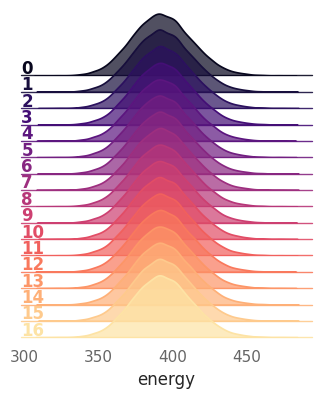

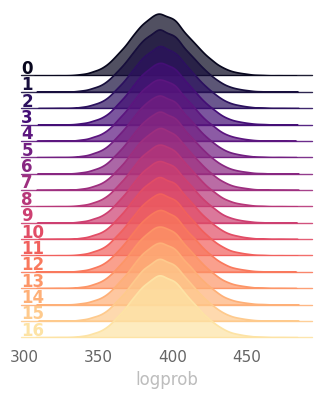

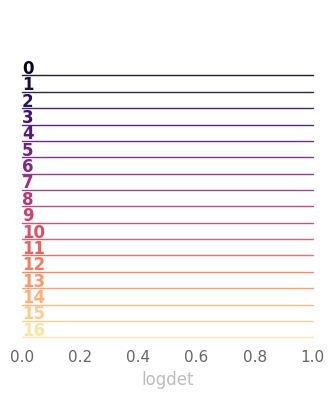

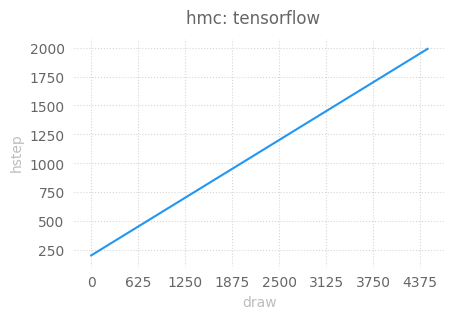

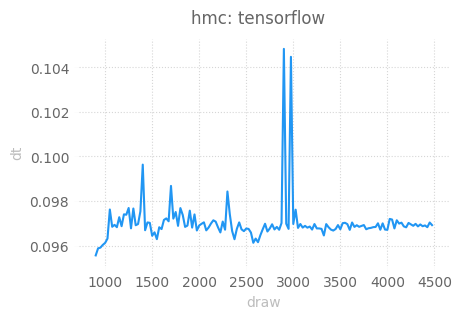

...

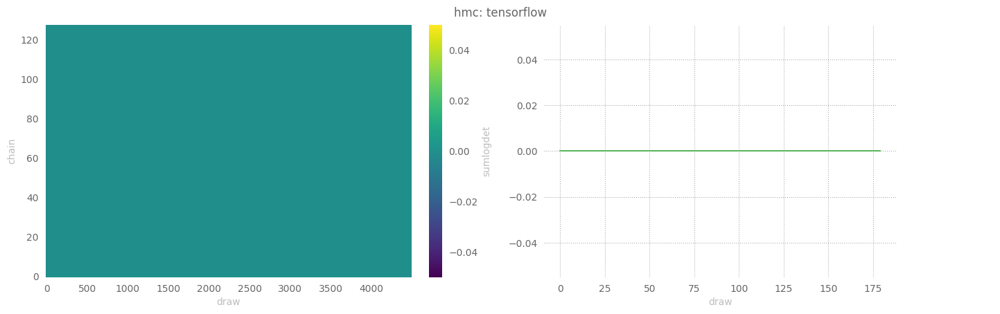

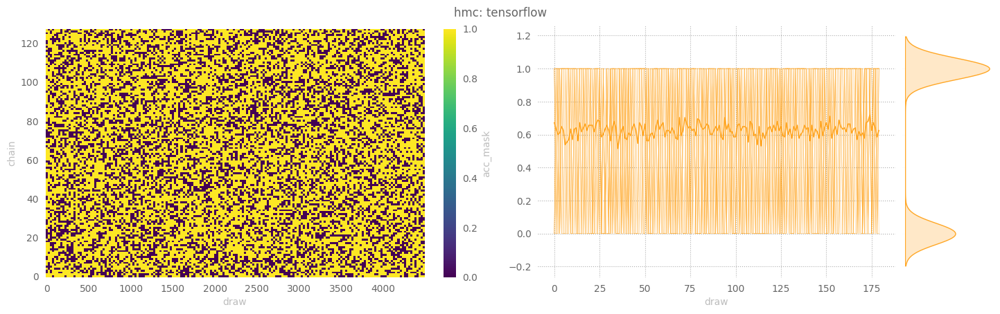

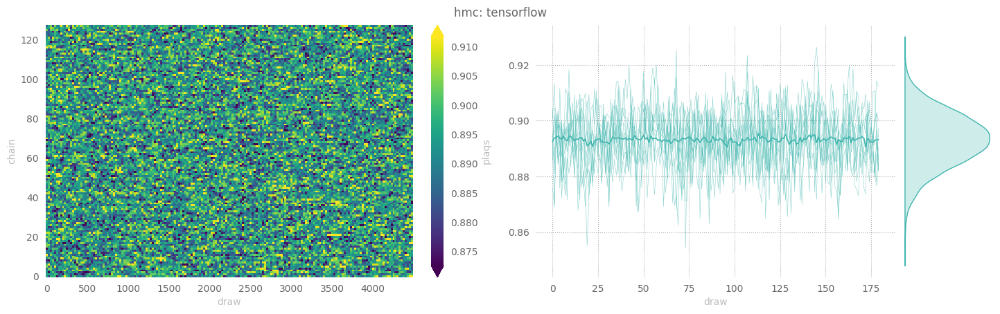

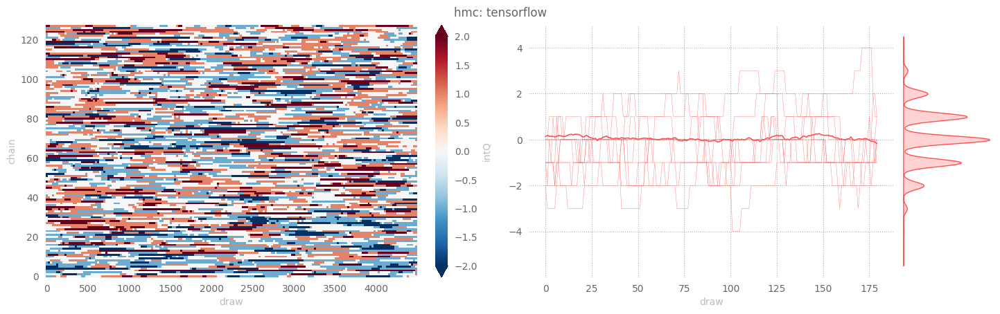

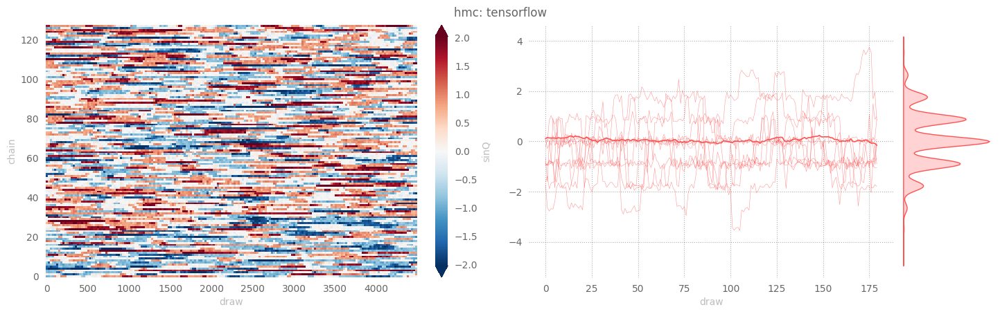

In [17]:
outputs['tensorflow']['hmc'] = tfExpU1.evaluate(
    job_type='hmc',
    nprint=100,
    nchains=128,
    eval_steps=2000,
)

# Model Performance

Our goal is improving the efficiency of our MCMC sampler.

In particular, we are interested in generating **independent** configurations which we can then use to calculate expectation values of physical observables.

For our purposes, we are interested in obtaining lattice configurations from distinct _topological charge sectors_, as characterized by a configurations _topological charge_, $Q$.

Explicitly, HMC is known to suffer from _critical slowing down_, a phenomenon in which our configurations remains stuck in some local topological charge sector and fails to produce distinct configurations.

Because of this, we can assess our models' performance by looking at the _tunneling rate_, i.e. the rate at which our sampler jumps between these different charge sectors.

We can write this quantity as:

$$
\delta Q = |Q^{(i)} - Q^{(i-1)}|
$$

i.e. look at the difference in the topological charge between sequential configurations.

<div class="alert alert-block alert-info">
<b>Note:</b> 
The efficiency of our sampler is directly proportional to the tunneling rate.
    
Explicitly, this means that the **more efficient** the model $\longrightarrow$
    
- the **larger** tunneling rate
- the **smaller** integrated autocorrelation time for $Q$
</div>

In [18]:
import xarray as xr

def get_thermalized_configs(
        x: np.ndarray | xr.DataArray,
        drop: int = 5
) -> np.ndarray | xr.DataArray:
    if isinstance(x, np.ndarray):
        return np.sort(x)[..., :-drop]
        #argmax = max(list(set(sorted(np.argmax(x, -1)))))
        #return sorted(x)[..., argmax+drop:]
    if isinstance(x, xr.DataArray):
        #argmax = max(list(set(sorted(x.argmax('draw').data))))
        #return sorted(x)[..., argmax+drop:]
        return x.sortby(['chain', 'draw'], ascending=False)[..., :-drop]
    raise TypeError

# Comparisons

We can measure our models' performance explicitly by looking at the average tunneling rate, $\delta Q_{\mathbb{Z}}$, for our **trained model** and comparing it against generic HMC.

Recall,

$$\delta Q_{\mathbb{Z}} := \big|Q^{(i+1)}_{\mathbb{Z}} - Q^{(i)}_{\mathbb{Z}}\big|$$

where a **higher** value of $\delta Q_{\mathbb{Z}}$ corresponds to **better** tunneling of the topological charge, $Q_{\mathbb{Z}}$.

Note that we can get a concise representation of the data from different parts of our run via:

Note that the data from each of the different parts of our experiment (i.e. `train`, `eval`, and `hmc`) are stored as a dict, e.g.

```python
>>> list(ptExpU1.trainer.histories.keys())
['train', 'eval', 'hmc']
>>> train_history = ptExpU1.trainer.histories['train']
>>> train_dset = train_history.get_dataset()
>>> assert isinstance(train_history, l2hmc.utils.history.BaseHistory)
>>> assert isinstance(train_dset, xarray.Dataset)
```

(see below, for example)

We aggregate the data into the `dsets` dict below, grouped by:

1. **Framework** (`pytorch` / `tensorflow`)
2. **Job type** (`train`, `eval`, `hmc`)

In [59]:
dqtfe.sortby(['chain', 'draw'], ascending=False)[:, :-5]

<xarray.DataArray 'dQint' (chain: 128, draw: 295)>
array([[0., 0., 1., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 1., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)
Coordinates:
  * draw     (draw) int64 299 298 297 296 295 294 293 292 ... 12 11 10 9 8 7 6 5
  * chain    (chain) int64 127 126 125 124 123 122 121 120 ... 7 6 5 4 3 2 1 0

In [19]:
import logging
log = logging.getLogger(__name__)
dsets = {}
fws = ['pt', 'tf']
modes = ['train', 'eval', 'hmc']
for fw in fws:
    dsets[fw] = {}
    for mode in modes:
        hist = None
        if fw == 'pt':
            hist = ptExpU1.trainer.histories.get(mode, None)
        elif fw == 'tf':
            hist = tfExpU1.trainer.histories.get(mode, None)
        if hist is not None:
            log.info(f'Getting dataset for {fw}: {mode}')
            dsets[fw][mode] = hist.get_dataset()

16:35:29 INFO     Getting dataset for pt: train                                                         ]8;id=177190;file:///tmp/ipykernel_1609526/2324717418.py\2324717418.py]8;;\:]8;id=974832;file:///tmp/ipykernel_1609526/2324717418.py#15\15]8;;\

16:35:30 INFO     Getting dataset for pt: eval                                                          ]8;id=595616;file:///tmp/ipykernel_1609526/2324717418.py\2324717418.py]8;;\:]8;id=479636;file:///tmp/ipykernel_1609526/2324717418.py#15\15]8;;\

         INFO     Getting dataset for pt: hmc                                                           ]8;id=842826;file:///tmp/ipykernel_1609526/2324717418.py\2324717418.py]8;;\:]8;id=700774;file:///tmp/ipykernel_1609526/2324717418.py#15\15]8;;\

         INFO     Getting dataset for tf: train                                                         ]8;id=497472;file:///tmp/ipykernel_1609526/2324717418.py\2324717418.py]8;;\:]8;id=691895;file:///tmp/ipykernel_1609526/2324717418.py#15\15]8;;\

         INFO     Getting dataset for tf: eval                                                          ]8;id=29668;file:///tmp/ipykernel_1609526/2324717418.py\2324717418.py]8;;\:]8;id=840271;file:///tmp/ipykernel_1609526/2324717418.py#15\15]8;;\

         INFO     Getting dataset for tf: hmc                                                           ]8;id=834266;file:///tmp/ipykernel_1609526/2324717418.py\2324717418.py]8;;\:]8;id=760794;file:///tmp/ipykernel_1609526/2324717418.py#15\15]8;;\

In [20]:
dsets['pt']['train']

<xarray.Dataset>
Dimensions:    (draw: 38, chain: 2048, leapfrog: 17)
Coordinates:
  * draw       (draw) int64 0 1 2 3 4 5 6 7 8 9 ... 29 30 31 32 33 34 35 36 37
  * chain      (chain) int64 0 1 2 3 4 5 6 ... 2042 2043 2044 2045 2046 2047
  * leapfrog   (leapfrog) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16
Data variables: (12/23)
    era        (draw) int64 0 0 0 0 0 0 0 0 0 0 0 0 ... 1 1 1 1 1 1 1 1 1 1 1 1
    epoch      (draw) int64 25 50 75 100 125 150 175 ... 350 375 400 425 450 475
    tstep      (draw) int64 25 50 75 100 125 150 175 ... 850 875 900 925 950 975
    dt         (draw) float64 0.688 0.6811 0.684 0.6863 ... 0.6872 0.6813 0.6876
    beta       (draw) float64 4.0 4.0 4.0 4.0 4.0 4.0 ... 5.0 5.0 5.0 5.0 5.0
    loss       (draw) float64 -21.24 -24.76 -33.37 -30.34 ... 2.127 0.9358 12.22
    ...         ...
    sumlogdet  (chain, draw) float32 0.0 -0.0 0.0 ... -0.3783 -0.0 0.3123
    acc_mask   (chain, draw) float32 0.0 0.0 0.0 1.0 1.0 ... 1.0 1.0 1.0 0.0 1.0
    plaqs      (chain, draw) float32 0.8567 0.8646 0.8531 ... 0.8935 0.8942
    intQ       (chain, draw) float32 -4.933e-07 6.071e-07 -1.0 ... -2.0 -1.0
    sinQ       (chain, draw) float32 -0.3214 0.2354 -0.7365 ... -1.858 -1.041
    lr         (draw) float64 0.001 0.001 0.001 0.001 ... 0.001 0.001 0.001

In [21]:
# -- PyTorch -----------------------
dqpte = dsets['pt']['eval']['dQint']  # eval
dqpth = dsets['pt']['hmc']['dQint']   # HMC

# -- TensorFlow --------------------
dqtfe = dsets['tf']['eval']['dQint']
dqtfh = dsets['tf']['hmc']['dQint']

In [40]:
from rich import print

for fw in ['pt', 'tf']:
    dqe = dsets[fw]['eval']['dQint']
    dqh = dsets[fw]['hmc']['dQint']
    print(
        '\n'.join([
            f'{fw}:',
            '',
            f'dq_eval, shape: {dqe.shape}',
            '',
            f'{dqe}',
            '',
            f'dq_hmc, shape: {dqh.shape}',
            '',
            f'{dqh}'
            '',
        ])
    )

pt:

dq_eval, shape: (128, 200)

[[0. 0. 0. ... 0. 0. 0.]
 [4. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [6. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]

dq_hmc, shape: (128, 200)

[[10.  0.  0. ...  0.  0.  0.]
 [ 2.  1.  0. ...  0.  0.  0.]
 [ 9.  0.  0. ...  0.  0.  0.]
 ...
 [ 8.  0.  0. ...  0.  0.  0.]
 [ 1.  0.  0. ...  0.  0.  0.]
 [ 8.  0.  0. ...  0.  0.  0.]]

tf:

dq_eval, shape: (128, 200)

[[ 0.  2.  1. ...  0.  0.  0.]
 [ 2.  0.  0. ...  0.  0.  0.]
 [ 4.  0.  0. ...  0.  0.  0.]
 ...
 [ 2.  0.  0. ...  0.  0.  0.]
 [12.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  1.]]

dq_hmc, shape: (128, 200)

[[2. 0. 0. ... 0. 0. 0.]
 [7. 0. 0. ... 0. 0. 0.]
 [9. 0. 0. ... 0. 0. 0.]
 ...
 [6. 0. 0. ... 0. 0. 0.]
 [3. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]]

In [41]:
dsets['pt']['eval']

<xarray.Dataset>
Dimensions:    (draw: 200, chain: 128, leapfrog: 17)
Coordinates:
  * draw       (draw) int64 0 1 2 3 4 5 6 7 ... 192 193 194 195 196 197 198 199
  * chain      (chain) int64 0 1 2 3 4 5 6 7 ... 120 121 122 123 124 125 126 127
  * leapfrog   (leapfrog) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16
Data variables: (12/20)
    estep      (draw) int64 0 10 20 30 40 50 ... 1940 1950 1960 1970 1980 1990
    dt         (draw) float64 0.4743 0.2138 0.1343 ... 0.1391 0.139 0.1416
    beta       (draw) float32 5.0 5.0 5.0 5.0 5.0 5.0 ... 5.0 5.0 5.0 5.0 5.0
    loss       (draw) float64 -546.5 -51.85 -11.71 -4.01 ... 1.794 3.803 2.321
    dQsin      (chain, draw) float32 0.4535 0.0 0.0 0.2129 ... 0.0 0.0 0.0
    dQint      (chain, draw) float32 7.153e-07 0.0 0.0 7.969e-07 ... 0.0 0.0 0.0
    ...         ...
    acc        (chain, draw) float32 1.0 0.1707 0.2756 ... 0.09795 0.2361
    sumlogdet  (chain, draw) float32 -1.175 0.0 0.0 0.2312 ... -0.0 -0.0 -0.0
    acc_mask   (chain, draw) float32 1.0 0.0 0.0 1.0 0.0 ... 0.0 1.0 0.0 0.0 0.0
    plaqs      (chain, draw) float32 -0.009382 0.875 0.877 ... 0.9089 0.9089
    intQ       (chain, draw) float32 -2.0 3.795e-07 7.21e-07 ... -1.0 -1.0 -1.0
    sinQ       (chain, draw) float32 -0.6484 -0.03788 ... -0.6897 -0.6897

In [42]:
dsets['tf']['eval']

<xarray.Dataset>
Dimensions:    (draw: 200, chain: 128, leapfrog: 17)
Coordinates:
  * draw       (draw) int64 0 1 2 3 4 5 6 7 ... 192 193 194 195 196 197 198 199
  * chain      (chain) int64 0 1 2 3 4 5 6 7 ... 120 121 122 123 124 125 126 127
  * leapfrog   (leapfrog) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16
Data variables: (12/20)
    estep      (draw) int64 0 10 20 30 40 50 ... 1940 1950 1960 1970 1980 1990
    dt         (draw) float64 1.12 0.5254 0.5265 0.5266 ... 0.5234 0.5239 0.5229
    beta       (draw) float32 5.0 5.0 5.0 5.0 5.0 5.0 ... 5.0 5.0 5.0 5.0 5.0
    loss       (draw) float32 -488.3 -35.96 -1.205 ... -1.574 -1.358 3.81
    dQsin      (chain, draw) float32 1.538 1.526 0.9921 ... 0.1765 0.2106 0.9032
    dQint      (chain, draw) float32 1.29e-06 2.0 1.0 ... 2.384e-07 5.96e-07 1.0
    ...         ...
    acc        (chain, draw) float32 1.0 0.8226 0.3475 ... 0.6715 0.5622 1.0
    sumlogdet  (chain, draw) float32 7.51e-05 9.263e-05 ... 6.723e-05 7.82e-05
    acc_mask   (chain, draw) float32 1.0 1.0 1.0 0.0 0.0 ... 1.0 1.0 1.0 1.0 1.0
    plaqs      (chain, draw) float32 0.00666 0.8649 0.8727 ... 0.8967 0.8786
    intQ       (chain, draw) float32 -1.29e-06 -1.897e-07 -1.0 ... 1.0 1.0 2.0
    sinQ       (chain, draw) float32 -0.5768 -0.06514 -0.9268 ... 0.6994 1.596

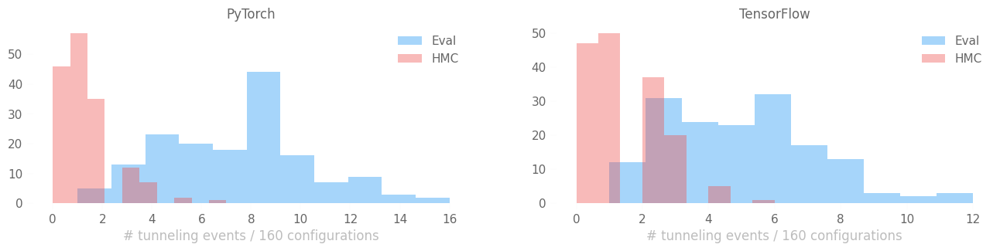

In [59]:
import matplotlib.pyplot as plt
from l2hmc.utils.plot_helpers import COLORS

fig, ax = plt.subplots(figsize=(16, 3), ncols=2)

# ---------------------------------------------
# ---- DROP FIRST 20% FOR THERMALIZATION ------
# ---------------------------------------------
KEEP = int(0.8 * len(dsets['tf']['eval'].draw))
           
dqpte = dsets['pt']['eval']['dQint'].astype('int')[:, -KEEP:]
dqpth = dsets['pt']['hmc']['dQint'].astype('int')[:, -KEEP:]

dqtfe = dsets['tf']['eval']['dQint'].astype('int')[:, -KEEP:]
dqtfh = dsets['tf']['hmc']['dQint'].astype('int')[:, -KEEP:]


_ = sns.distplot(
    dqpte.sum('chain'),
    kde=False,
    color=COLORS['blue'],
    label='Eval',
    ax=ax[0]
)
_ = sns.distplot(
    dqpth.sum('chain'),
    kde=False,
    color=COLORS['red'],
    label='HMC',
    ax=ax[0]
)

_ = ax[0].set_title('PyTorch')
_ = ax[0].set_xlabel(
    f'# tunneling events / {dqpte.shape[-1]} configurations'
)
_ = ax[0].legend(loc='best', frameon=False)
plt.legend()

_ = sns.distplot(
    dqtfe.sum('chain'),
    kde=False,
    color=COLORS['blue'],
    label='Eval',
    ax=ax[1]
)
_ = sns.distplot(
    dqtfh.sum('chain'),
    kde=False,
    color=COLORS['red'],
    label='HMC',
    ax=ax[1]
)

_ = ax[1].set_title('TensorFlow')
_ = ax[1].set_xlabel(
    f'# tunneling events / {dqpte.shape[-1]} configurations'
)
_ = ax[1].legend(loc='best', frameon=False)

## TensorFlow Results

16:52:30 INFO     TensorFlow, EVAL                                                                      ]8;id=995089;file:///tmp/ipykernel_1609526/1383042264.py\1383042264.py]8;;\:]8;id=880082;file:///tmp/ipykernel_1609526/1383042264.py#21\21]8;;\
                   dQint.sum('chain'):                                                                                  
                   [ 2  6  4  7  8  4  6  4  3  5  8  6  5  4  5  3  2  4  3  3  3  5  6  8                             
                   11  4  7  3  6  3  5  6  3  6  3  3  5  4  6  7  4  5  7  8  8  7  6  7                              
                    7  7  9  6  4  1  3  4  3  5  3  2  3  4  3  6  6  6  6  7  4  5  9  1                              
                    8  6  4  6  1  6  2 10  5  4  7  8  4  5  4  6  6  6]                                               

         INFO     dQint.sum(): 460                                                                      ]8;id=255103;file:///tmp/ipykernel_1609526/1383042264.py\1383042264.py]8;;\:]8;id=722111;file:///tmp/ipykernel_1609526/1383042264.py#22\22]8;;\

         INFO     TensorFlow, HMC                                                                       ]8;id=172228;file:///tmp/ipykernel_1609526/1383042264.py\1383042264.py]8;;\:]8;id=958426;file:///tmp/ipykernel_1609526/1383042264.py#23\23]8;;\
                   dQint.sum('chain'):                                                                                  
                   [0 2 2 1 0 0 2 0 0 0 1 1 2 0 1 0 2 1 0 1 2 3 2 1 1 2 1 1 1 1 0 2 1 2 1 0 0                           
                   0 0 1 1 3 3 0 1 2 2 0 1 2 1 0 3 3 0 1 1 0 2 1 2 1 1 4 2 1 4 0 6 0 0 2 1 1                            
                   0 2 2 0 1 3 1 2 0 1 1 2 2 0 0 1]                                                                     

         INFO     dQint.sum(): 108                                                                      ]8;id=531032;file:///tmp/ipykernel_1609526/1383042264.py\1383042264.py]8;;\:]8;id=791085;file:///tmp/ipykernel_1609526/1383042264.py#24\24]8;;\

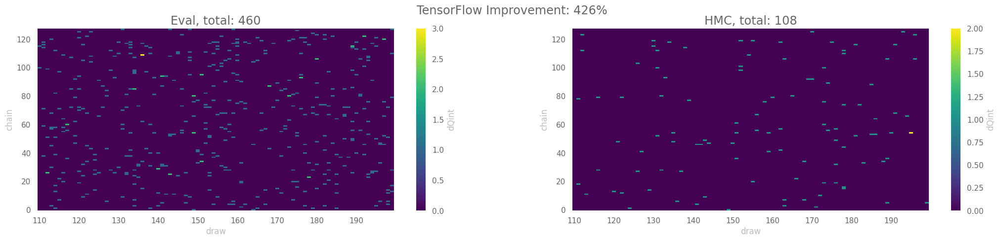

In [60]:
sns.set_context('notebook')
ndraws = len(dsets['tf']['eval']['dQint'].draw)
drop = int(0.1 * ndraws)
keep = int(0.9 * ndraws)

dqe = dsets['tf']['eval']['dQint'][:, -90:]
dqh = dsets['tf']['hmc']['dQint'][:, -90:]

etot = dqe.astype(int).sum()
htot = dqh.astype(int).sum()

fsize = plt.rcParams['figure.figsize']
figsize = (4. * fsize[0], fsize[1])
fig, ax = plt.subplots(figsize=figsize, ncols=2)
_ = dqe.astype(int).plot(ax=ax[0])
_ = dqh.astype(int).plot(ax=ax[1])
_ = ax[0].set_title(f'Eval, total: {etot}', fontsize='x-large');
_ = ax[1].set_title(f'HMC, total: {htot}', fontsize='x-large');
_ = fig.suptitle(fr'TensorFlow Improvement: {100*(etot / htot):3.0f}%', fontsize='x-large')

log.info(f"TensorFlow, EVAL\n dQint.sum('chain'):\n {dqe.astype(int).sum('chain').T}")
log.info(f"dQint.sum(): {dqe.astype(int).sum().T}")
log.info(f"TensorFlow, HMC\n dQint.sum('chain'):\n {dqh.astype(int).sum('chain').T}")
log.info(f"dQint.sum(): {dqh.astype(int).sum().T}")

## PyTorch Results

16:52:35 INFO     PyTorch, EVAL                                                                          ]8;id=529534;file:///tmp/ipykernel_1609526/272571773.py\272571773.py]8;;\:]8;id=724931;file:///tmp/ipykernel_1609526/272571773.py#21\21]8;;\
                   dQint.sum('chain'):                                                                                  
                   [ 6  8  9 12  5  7  7  3  7  8  6  5  3  8 10  9  5  8  9  6  9  3 10  6                             
                    4  6 10 11  9  7  7 10  4  9 10  1 11  7  9 10  8 12  7  3 11  6  9  8                              
                    7  3  5  3  3  4  3  7  6 13  4  7  9  8  9  2  8  5 15 11  8  8  6 12                              
                    8 11  9  9 11 10 10  6  8  3  7  8 10  6 12  9  4  3]                                               

         INFO     dQint.sum(): 668                                                                       ]8;id=811019;file:///tmp/ipykernel_1609526/272571773.py\272571773.py]8;;\:]8;id=412251;file:///tmp/ipykernel_1609526/272571773.py#22\22]8;;\

         INFO     PyTorch, HMC                                                                           ]8;id=894621;file:///tmp/ipykernel_1609526/272571773.py\272571773.py]8;;\:]8;id=879570;file:///tmp/ipykernel_1609526/272571773.py#23\23]8;;\
                   dQint.sum('chain'):                                                                                  
                   [0 2 1 1 0 4 3 5 1 0 1 0 0 0 1 1 2 4 1 3 0 1 4 0 1 1 0 1 2 0 0 2 2 2 2 2 5                           
                   4 1 2 1 1 0 1 3 0 2 2 1 0 0 2 0 2 1 1 1 2 0 1 2 2 2 1 0 1 1 2 1 3 3 1 1 2                            
                   0 2 3 1 3 0 2 0 0 1 2 1 1 2 2 1]                                                                     

         INFO     dQint.sum(): 126                                                                       ]8;id=342363;file:///tmp/ipykernel_1609526/272571773.py\272571773.py]8;;\:]8;id=135184;file:///tmp/ipykernel_1609526/272571773.py#24\24]8;;\

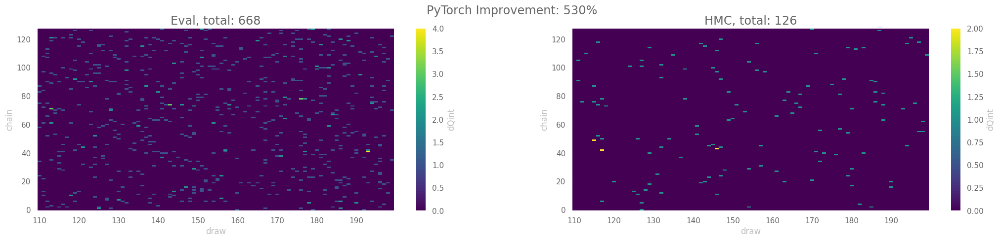

In [61]:
sns.set_context('notebook')
ndraws = len(dsets['pt']['eval']['dQint'].draw)
drop = int(0.1 * ndraws)
keep = int(0.9 * ndraws)

dqe = dsets['pt']['eval']['dQint'][:, -90:]
dqh = dsets['pt']['hmc']['dQint'][:, -90:]

etot = dqe.astype(int).sum()
htot = dqh.astype(int).sum()

fsize = plt.rcParams['figure.figsize']
figsize = (4. * fsize[0], fsize[1])
fig, ax = plt.subplots(figsize=figsize, ncols=2)
_ = dqe.astype(int).plot(ax=ax[0])
_ = dqh.astype(int).plot(ax=ax[1])
_ = ax[0].set_title(f'Eval, total: {etot}', fontsize='x-large');
_ = ax[1].set_title(f'HMC, total: {htot}', fontsize='x-large');
_ = fig.suptitle(fr'PyTorch Improvement: {100*(etot / htot):3.0f}%', fontsize='x-large')

log.info(f"PyTorch, EVAL\n dQint.sum('chain'):\n {dqe.astype(int).sum('chain').T}")
log.info(f"dQint.sum(): {dqe.astype(int).sum().T}")
log.info(f"PyTorch, HMC\n dQint.sum('chain'):\n {dqh.astype(int).sum('chain').T}")
log.info(f"dQint.sum(): {dqh.astype(int).sum().T}")

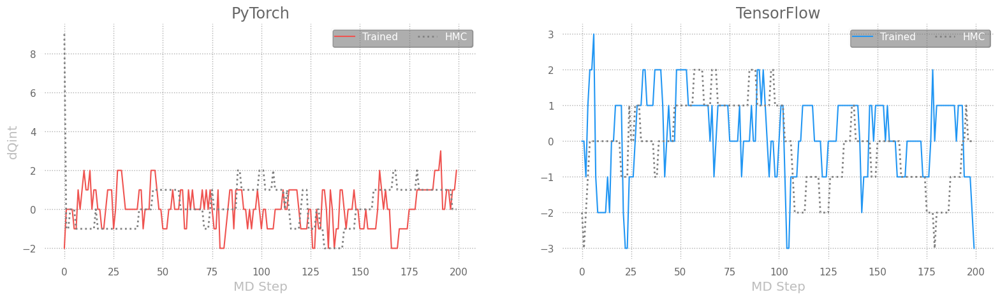

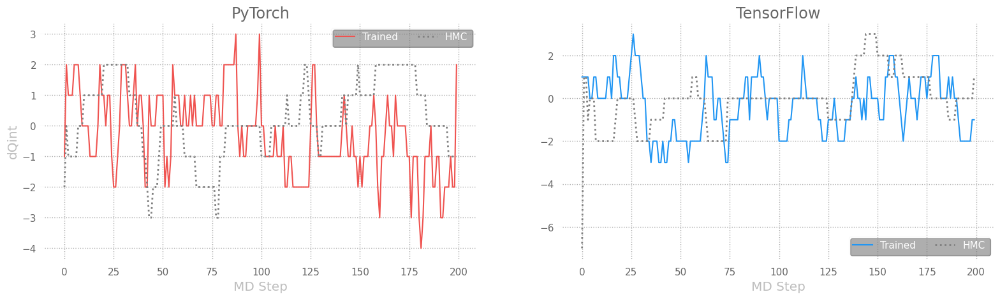

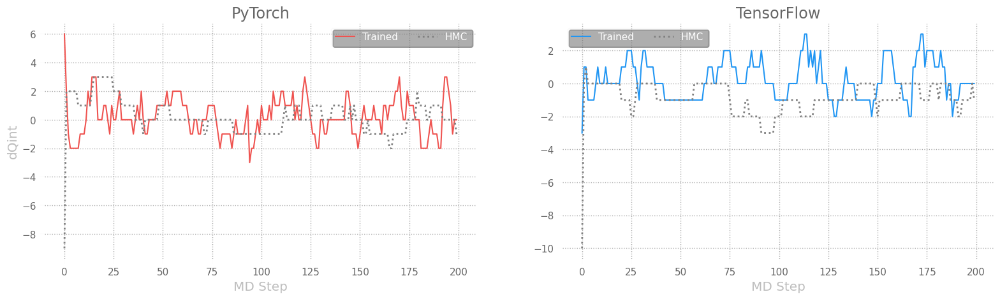

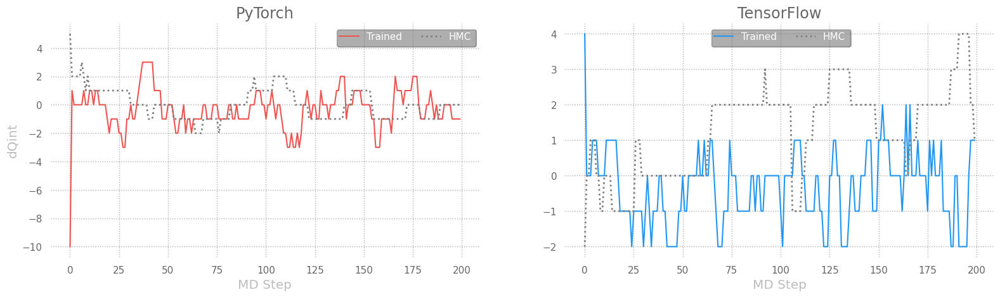

In [51]:
import matplotlib.pyplot as plt
from l2hmc.utils.plot_helpers import set_plot_style, COLORS

import seaborn as sns
set_plot_style()
plt.rcParams['axes.linewidth'] = 2.0
sns.set_context('notebook')
figsize = plt.rcParamsDefault['figure.figsize']
plt.rcParams['figure.dpi'] = plt.rcParamsDefault['figure.dpi']

for idx in range(4):
    fig, (ax, ax1) = plt.subplots(
        ncols=2,
        #nrows=4,
        figsize=(3. * figsize[0], figsize[1]),
    )
    _ = ax.plot(
        dsets['pt']['eval'].intQ[idx],  # .dQint.mean('chain')[100:],
        color=COLORS['red'],
        ls='-',
        label='Trained',
        lw=1.5,
    );

    _ = ax.plot(
        dsets['pt']['hmc'].intQ[idx],  # .dQint.mean('chain')[100:],
        ls=':',
        label='HMC',
        color='#808080',
        zorder=5,
        lw=2.0,
    );

    _ = ax1.plot(
        dsets['tf']['eval'].intQ[idx],  # .dQint.mean('chain')[-100:],
        color=COLORS['blue'],
        ls='-',
        label='Trained',
        lw=1.5,

    );
    _ = ax1.plot(
        dsets['tf']['hmc'].intQ[idx],  # .dQint.mean('chain')[-100:],
        color='#808080',
        ls=':',
        label='HMC',
        zorder=5,
        lw=2.0,
    );
    _ = ax.set_title('PyTorch', fontsize='x-large')
    _ = ax1.set_title('TensorFlow', fontsize='x-large')
    #_ = ax1.set_ylim(ax.get_ylim())
    _ = ax.grid(True, alpha=0.4)
    _ = ax1.grid(True, alpha=0.4)
    _ = ax.set_xlabel('MD Step', fontsize='large')
    _ = ax1.set_xlabel('MD Step', fontsize='large')
    _ = ax.set_ylabel('dQint', fontsize='large')
    _ = ax.legend(loc='best', framealpha=0.1, ncol=2, labelcolor='#fff', shadow=True)
    _ = ax1.legend(loc='best', framealpha=0.1, ncol=2, labelcolor='#fff', shadow=True)